In [16]:
# from data_synthesizer.util import  plot_training_loss, ModelType
from typing import Tuple
import pandas as pd
import pickle

from data_loader import DataLoader
from data_synthesizer.pipeline import  load_all_results
from data_synthesizer.privacy_sampling import get_epsilon


In [17]:
import sys
from pathlib import Path

# Add repo root so `import experiments` works in notebooks.
sys.path.append(str(Path.cwd().parent.parent))

from experiments.paths import RESULTS_DIR, DATA_DIR, BASELINE_DIR, EXTRA_DIR


In [18]:
from experiments.pipeline_experiment.epsilon_comparison_multivariate_resemblance_utils import (
    filter_by_prefix,
    plot_pearson_over_tau,
    plot_cramer_over_tau,
    plot_corr_ratio_over_tau,
    plot_delta_heatmaps_over_tau,
    plot_matrix_error_over_tau,
    plot_ressemblance_curves,
    plot_ressemblance_curves_notscale,
    print_correlation_matrices,
)


## Loading Data

In [19]:
!git -C ../../pipeline_tabular_data_results lfs pull --include "data/**"
!git -C ../../pipeline_tabular_data_results lfs pull --include "baseline/**"
!git -C ../../pipeline_tabular_data_results lfs pull --include "epsilon_comparison_heom_any/**"

In [20]:
cat_list_credit_card = ['SEX', 'EDUCATION', 'MARRIAGE', 'PAY_0','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6', 'default.payment.next.month']
num_list_credit_card = ['LIMIT_BAL', 'AGE', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4','BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3','PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']
credit_qai_columns = ['LIMIT_BAL','SEX','EDUCATION','MARRIAGE','AGE']
credit_risk_column = ['PAY_0','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6','BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6','PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6','default.payment.next.month']

df_real_credit_card_train = DataLoader(f'{DATA_DIR}/credit_card_Train.csv').get_dataframe(cat_list_credit_card, str, drop_identation=True)
df_real_credit_card_test = DataLoader(f'{DATA_DIR}/credit_card_Test.csv').get_dataframe(cat_list_credit_card, str, drop_identation=True)
credit_real_dict ={'data' : df_real_credit_card_train, 'cat_list' : cat_list_credit_card, 'num_list' : num_list_credit_card}

In [21]:
cat_list_adult = ['workclass','education','marital-status','occupation','relationship','race','sex','native-country','income']
num_list_adult = ['age','fnlwgt','education-num','capital-gain','capital-loss','hours-per-week']
adult_qai_columns = ['education','education-num','marital-status','occupation','relationship','sex', 'native-country']
adult_risk_column = ['capital-gain','capital-loss','hours-per-week','native-country','income', 'race']
df_real_adult_train = DataLoader(f'{DATA_DIR}/adult_train.csv').get_dataframe(cat_list_adult, str)
df_real_adult_test = DataLoader(f'{DATA_DIR}/adult_test.csv').get_dataframe(cat_list_adult, str)

In [22]:
num_list_cardio = ['age', 'height', 'weight', 'ap_hi', 'ap_lo']
cat_list_cardio = ['gender','cholesterol', 'gluc', 'smoke', 'alco', 'active', 'cardio']

cardio_qai_columns = ['age','gender','height','weight']
cardio_risk_column = ['ap_lo','ap_hi','cholesterol','gluc','smoke','alco','active','cardio']

df_real_cardio_train = DataLoader(f'{DATA_DIR}/cardio_train.csv').get_dataframe(cat_list_cardio, category_type=str, sep = ',')
df_real_cardio_test = DataLoader(f'{DATA_DIR}/cardio_test.csv').get_dataframe(cat_list_cardio, category_type=str, sep = ',')

In [ ]:
credit_ctgan  = load_all_results(f'{BASELINE_DIR}/credit_ctgan_baseline').to_legacy_dict()
credit_tvae  = load_all_results(f'{BASELINE_DIR}/credit_tvae_baseline').to_legacy_dict()

credit_ctgan  = load_all_results(f'{BASELINE_DIR}/credit_ctgan_baseline').to_legacy_dict()
credit_tvae  = load_all_results(f'{BASELINE_DIR}/credit_tvae_baseline').to_legacy_dict()
credit_ctgan_heom_any_eps_0005  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/credit_ctgan_eps_0.005').to_legacy_dict()
credit_ctgan_heom_any_eps_001  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/credit_ctgan_eps_0.01').to_legacy_dict()
credit_ctgan_heom_any_eps_005  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/credit_ctgan_eps_0.05').to_legacy_dict()
credit_ctgan_heom_any_eps_01  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/credit_ctgan_eps_0.1').to_legacy_dict()
credit_ctgan_heom_any_eps_015  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/credit_ctgan_eps_0.15').to_legacy_dict()
credit_ctgan_heom_any_eps_02  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/credit_ctgan_eps_0.2').to_legacy_dict()
credit_ctgan_heom_any_eps_025  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/credit_ctgan_eps_0.25').to_legacy_dict()
credit_ctgan_heom_any_eps_03  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/credit_ctgan_eps_0.3').to_legacy_dict()
credit_ctgan_heom_any_eps_035  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/credit_ctgan_eps_0.35').to_legacy_dict()
credit_ctgan_heom_any_eps_04  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/credit_ctgan_eps_0.4').to_legacy_dict()

credit_tvae_heom_any_eps_0005  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/credit_tvae_eps_0.005').to_legacy_dict()
credit_tvae_heom_any_eps_001  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/credit_tvae_eps_0.01').to_legacy_dict()
credit_tvae_heom_any_eps_005  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/credit_tvae_eps_0.05').to_legacy_dict()
credit_tvae_heom_any_eps_01  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/credit_tvae_eps_0.1').to_legacy_dict()
credit_tvae_heom_any_eps_015  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/credit_tvae_eps_0.15').to_legacy_dict()
credit_tvae_heom_any_eps_02  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/credit_tvae_eps_0.2').to_legacy_dict()
credit_tvae_heom_any_eps_025  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/credit_tvae_eps_0.25').to_legacy_dict()
credit_tvae_heom_any_eps_03  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/credit_tvae_eps_0.3').to_legacy_dict()
credit_tvae_heom_any_eps_035  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/credit_tvae_eps_0.35').to_legacy_dict()
credit_tvae_heom_any_eps_04  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/credit_tvae_eps_0.4').to_legacy_dict()

dict_results_credit_ctgan_heom_any  = {
    'credit CTGAN' : credit_ctgan,
    'credit CTGAN 0.4' : credit_ctgan_heom_any_eps_04,
    'credit CTGAN 0.35' : credit_ctgan_heom_any_eps_035,
    'credit CTGAN 0.3' : credit_ctgan_heom_any_eps_03,
    'credit CTGAN 0.25' : credit_ctgan_heom_any_eps_025,
    'credit CTGAN 0.2' : credit_ctgan_heom_any_eps_02,
    'credit CTGAN 0.15' : credit_ctgan_heom_any_eps_015,
    'credit CTGAN 0.1' : credit_ctgan_heom_any_eps_01,
    'credit CTGAN 0.05' : credit_ctgan_heom_any_eps_005,
    'credit CTGAN 0.01' : credit_ctgan_heom_any_eps_001,
    'credit CTGAN 0.005' : credit_ctgan_heom_any_eps_0005,    
}
dict_results_credit_tvae_heom_any  = {
    'credit TVAE' : credit_tvae,
    'credit TVAE 0.4' : credit_tvae_heom_any_eps_04,
    'credit TVAE 0.35' : credit_tvae_heom_any_eps_035,
    'credit TVAE 0.3' :credit_tvae_heom_any_eps_03,
    'credit TVAE 0.25' :credit_tvae_heom_any_eps_025,
    'credit TVAE 0.2' :credit_tvae_heom_any_eps_02,
    'credit TVAE 0.15' :credit_tvae_heom_any_eps_015,
    'credit TVAE 0.1' :credit_tvae_heom_any_eps_01,
    'credit TVAE 0.05' :credit_tvae_heom_any_eps_005,
    'credit TVAE 0.01' :credit_tvae_heom_any_eps_001,
    'credit TVAE 0.005' :credit_tvae_heom_any_eps_0005
}

In [ ]:
adult_ctgan  = load_all_results(f'{BASELINE_DIR}/adult_ctgan_baseline').to_legacy_dict()
adult_tvae  = load_all_results(f'{BASELINE_DIR}/adult_tvae_baseline').to_legacy_dict()

adult_ctgan  = load_all_results(f'{BASELINE_DIR}/adult_ctgan_baseline').to_legacy_dict()
adult_tvae  = load_all_results(f'{BASELINE_DIR}/adult_tvae_baseline').to_legacy_dict()
adult_ctgan_heom_any_eps_0005  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/adult_ctgan_eps_0.005').to_legacy_dict()
adult_ctgan_heom_any_eps_001  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/adult_ctgan_eps_0.01').to_legacy_dict()
adult_ctgan_heom_any_eps_005  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/adult_ctgan_eps_0.05').to_legacy_dict()
adult_ctgan_heom_any_eps_01  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/adult_ctgan_eps_0.1').to_legacy_dict()
adult_ctgan_heom_any_eps_015  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/adult_ctgan_eps_0.15').to_legacy_dict()
adult_ctgan_heom_any_eps_02  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/adult_ctgan_eps_0.2').to_legacy_dict()
adult_ctgan_heom_any_eps_025  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/adult_ctgan_eps_0.25').to_legacy_dict()
adult_ctgan_heom_any_eps_03  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/adult_ctgan_eps_0.3').to_legacy_dict()
adult_ctgan_heom_any_eps_035  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/adult_ctgan_eps_0.35').to_legacy_dict()
adult_ctgan_heom_any_eps_04  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/adult_ctgan_eps_0.4').to_legacy_dict()

adult_tvae_heom_any_eps_0005  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/adult_tvae_eps_0.005').to_legacy_dict()
adult_tvae_heom_any_eps_001  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/adult_tvae_eps_0.01').to_legacy_dict()
adult_tvae_heom_any_eps_005  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/adult_tvae_eps_0.05').to_legacy_dict()
adult_tvae_heom_any_eps_01  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/adult_tvae_eps_0.1').to_legacy_dict()
adult_tvae_heom_any_eps_015  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/adult_tvae_eps_0.15').to_legacy_dict()
adult_tvae_heom_any_eps_02  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/adult_tvae_eps_0.2').to_legacy_dict()
adult_tvae_heom_any_eps_025  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/adult_tvae_eps_0.25').to_legacy_dict()
adult_tvae_heom_any_eps_03  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/adult_tvae_eps_0.3').to_legacy_dict()
adult_tvae_heom_any_eps_035  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/adult_tvae_eps_0.35').to_legacy_dict()
adult_tvae_heom_any_eps_04  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/adult_tvae_eps_0.4').to_legacy_dict()

dict_results_adult_ctgan_heom_any  = {
    'adult CTGAN' : adult_ctgan,
    'adult CTGAN 0.4' : adult_ctgan_heom_any_eps_04,
    'adult CTGAN 0.35' : adult_ctgan_heom_any_eps_035,
    'adult CTGAN 0.3' : adult_ctgan_heom_any_eps_03,
    'adult CTGAN 0.25' : adult_ctgan_heom_any_eps_025,
    'adult CTGAN 0.2' : adult_ctgan_heom_any_eps_02,
    'adult CTGAN 0.15' : adult_ctgan_heom_any_eps_015,
    'adult CTGAN 0.1' : adult_ctgan_heom_any_eps_01,
    'adult CTGAN 0.05' : adult_ctgan_heom_any_eps_005,
    'adult CTGAN 0.01' : adult_ctgan_heom_any_eps_001,
    'adult CTGAN 0.005' : adult_ctgan_heom_any_eps_0005,    
}
dict_results_adult_tvae_heom_any  = {
    'adult TVAE' : adult_tvae,
    'adult TVAE 0.4' : adult_tvae_heom_any_eps_04,
    'adult TVAE 0.35' : adult_tvae_heom_any_eps_035,
    'adult TVAE 0.3' :adult_tvae_heom_any_eps_03,
    'adult TVAE 0.25' :adult_tvae_heom_any_eps_025,
    'adult TVAE 0.2' :adult_tvae_heom_any_eps_02,
    'adult TVAE 0.15' :adult_tvae_heom_any_eps_015,
    'adult TVAE 0.1' :adult_tvae_heom_any_eps_01,
    'adult TVAE 0.05' :adult_tvae_heom_any_eps_005,
    'adult TVAE 0.01' :adult_tvae_heom_any_eps_001,
    'adult TVAE 0.005' :adult_tvae_heom_any_eps_0005
}

In [ ]:
cardio_ctgan  = load_all_results(f'{BASELINE_DIR}/cardio_ctgan_baseline').to_legacy_dict()
cardio_tvae  = load_all_results(f'{BASELINE_DIR}/cardio_tvae_baseline').to_legacy_dict()


cardio_ctgan  = load_all_results(f'{BASELINE_DIR}/cardio_ctgan_baseline').to_legacy_dict()
cardio_tvae  = load_all_results(f'{BASELINE_DIR}/cardio_tvae_baseline').to_legacy_dict()
cardio_ctgan_heom_any_eps_0005  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/cardio_ctgan_eps_0.005').to_legacy_dict()
cardio_ctgan_heom_any_eps_001  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/cardio_ctgan_eps_0.01').to_legacy_dict()
cardio_ctgan_heom_any_eps_005  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/cardio_ctgan_eps_0.05').to_legacy_dict()
cardio_ctgan_heom_any_eps_01  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/cardio_ctgan_eps_0.1').to_legacy_dict()
cardio_ctgan_heom_any_eps_015  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/cardio_ctgan_eps_0.15').to_legacy_dict()
cardio_ctgan_heom_any_eps_02  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/cardio_ctgan_eps_0.2').to_legacy_dict()
cardio_ctgan_heom_any_eps_025  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/cardio_ctgan_eps_0.25').to_legacy_dict()
cardio_ctgan_heom_any_eps_03  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/cardio_ctgan_eps_0.3').to_legacy_dict()
cardio_ctgan_heom_any_eps_035  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/cardio_ctgan_eps_0.35').to_legacy_dict()
cardio_ctgan_heom_any_eps_04  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/cardio_ctgan_eps_0.4').to_legacy_dict()

cardio_tvae_heom_any_eps_0005  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/cardio_tvae_eps_0.005').to_legacy_dict()
cardio_tvae_heom_any_eps_001  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/cardio_tvae_eps_0.01').to_legacy_dict()
cardio_tvae_heom_any_eps_005  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/cardio_tvae_eps_0.05').to_legacy_dict()
cardio_tvae_heom_any_eps_01  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/cardio_tvae_eps_0.1').to_legacy_dict()
cardio_tvae_heom_any_eps_015  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/cardio_tvae_eps_0.15').to_legacy_dict()
cardio_tvae_heom_any_eps_02  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/cardio_tvae_eps_0.2').to_legacy_dict()
cardio_tvae_heom_any_eps_025  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/cardio_tvae_eps_0.25').to_legacy_dict()
cardio_tvae_heom_any_eps_03  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/cardio_tvae_eps_0.3').to_legacy_dict()
cardio_tvae_heom_any_eps_035  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/cardio_tvae_eps_0.35').to_legacy_dict()
cardio_tvae_heom_any_eps_04  = load_all_results(f'{RESULTS_DIR}/epsilon_comparison_heom_any/cardio_tvae_eps_0.4').to_legacy_dict()

dict_results_cardio_ctgan_heom_any  = {
    'cardio CTGAN' : cardio_ctgan,
    'cardio CTGAN 0.4' : cardio_ctgan_heom_any_eps_04,
    'cardio CTGAN 0.35' : cardio_ctgan_heom_any_eps_035,
    'cardio CTGAN 0.3' : cardio_ctgan_heom_any_eps_03,
    'cardio CTGAN 0.25' : cardio_ctgan_heom_any_eps_025,
    'cardio CTGAN 0.2' : cardio_ctgan_heom_any_eps_02,
    'cardio CTGAN 0.15' : cardio_ctgan_heom_any_eps_015,
    'cardio CTGAN 0.1' : cardio_ctgan_heom_any_eps_01,
    'cardio CTGAN 0.05' : cardio_ctgan_heom_any_eps_005,
    'cardio CTGAN 0.01' : cardio_ctgan_heom_any_eps_001,
    'cardio CTGAN 0.005' : cardio_ctgan_heom_any_eps_0005,    
}
dict_results_cardio_tvae_heom_any  = {
    'cardio TVAE' : cardio_tvae,
    'cardio TVAE 0.4' : cardio_tvae_heom_any_eps_04,
    'cardio TVAE 0.35' : cardio_tvae_heom_any_eps_035,
    'cardio TVAE 0.3' :cardio_tvae_heom_any_eps_03,
    'cardio TVAE 0.25' :cardio_tvae_heom_any_eps_025,
    'cardio TVAE 0.2' :cardio_tvae_heom_any_eps_02,
    'cardio TVAE 0.15' :cardio_tvae_heom_any_eps_015,
    'cardio TVAE 0.1' :cardio_tvae_heom_any_eps_01,
    'cardio TVAE 0.05' :cardio_tvae_heom_any_eps_005,
    'cardio TVAE 0.01' :cardio_tvae_heom_any_eps_001,
    'cardio TVAE 0.005' :cardio_tvae_heom_any_eps_0005
}

## Visualization of $\epsilon$ versus ressemblance multivariate

### Credit Card

#### Credit-CTGAN

In [26]:
diff = {}
epsilon = [ 'credit CTGAN : baseline',
            'credit CTGAN eps = 0.4',
            'credit CTGAN eps = 0.35',
            'credit CTGAN eps = 0.3',
            'credit CTGAN eps = 0.25',
            'credit CTGAN eps = 0.2',
            'credit CTGAN eps = 0.15',
            'credit CTGAN eps = 0.1',
            'credit CTGAN eps = 0.05',
            'credit CTGAN eps = 0.01',
            'credit CTGAN eps = 0.005']


for result , key in zip(dict_results_credit_ctgan_heom_any.values(), epsilon) :
    pearson_diff = result['resemblance_evaluation_results']['numerical_multivariate']['pearson_spearman_correlation_coefficient']
    corr_ratio_diff = result['resemblance_evaluation_results']['categorical_numerical_multivariate']['corr_ratio_spearman_correlation_coefficient']['corr']
    cramer_diff = result['resemblance_evaluation_results']['categorical_multivariate']['cramer_spearman_correlation_coefficient']

    diff[key] = [pearson_diff, cramer_diff, corr_ratio_diff]
print(pd.DataFrame(diff, index=['Pearson', "Cramer's", "Correlation ratio"]).to_markdown())



|                   |   credit CTGAN : baseline |   credit CTGAN eps = 0.4 |   credit CTGAN eps = 0.35 |   credit CTGAN eps = 0.3 |   credit CTGAN eps = 0.25 |   credit CTGAN eps = 0.2 |   credit CTGAN eps = 0.15 |   credit CTGAN eps = 0.1 |   credit CTGAN eps = 0.05 |   credit CTGAN eps = 0.01 |   credit CTGAN eps = 0.005 |
|:------------------|--------------------------:|-------------------------:|--------------------------:|-------------------------:|--------------------------:|-------------------------:|--------------------------:|-------------------------:|--------------------------:|--------------------------:|---------------------------:|
| Pearson           |                  0.793741 |                 0.795461 |                  0.787641 |                 0.78194  |                  0.785444 |                 0.794633 |                  0.803074 |                 0.786781 |                  0.803822 |                  0.807867 |                   0.790269 |
| Cramer's         

In [27]:
epsilon = [ 'credit CTGAN : baseline',
            'credit CTGAN eps = 0.4',
            'credit CTGAN eps = 0.35',
            'credit CTGAN eps = 0.3',
            'credit CTGAN eps = 0.25',
            'credit CTGAN eps = 0.2',
            'credit CTGAN eps = 0.15',
            'credit CTGAN eps = 0.1',
            'credit CTGAN eps = 0.05',
            'credit CTGAN eps = 0.01',
            'credit CTGAN eps = 0.005']

print_correlation_matrices(dict_results_credit_ctgan_heom_any, epsilon,'credit CTGAN' )




 
 pearson correlation matrix - Real data credit CTGAN : 
 

|           |   LIMIT_BAL |       AGE |   BILL_AMT1 |   BILL_AMT2 |   BILL_AMT3 |   BILL_AMT4 |   BILL_AMT5 |   BILL_AMT6 |   PAY_AMT1 |   PAY_AMT2 |   PAY_AMT3 |   PAY_AMT4 |   PAY_AMT5 |   PAY_AMT6 |
|:----------|------------:|----------:|------------:|------------:|------------:|------------:|------------:|------------:|-----------:|-----------:|-----------:|-----------:|-----------:|-----------:|
| LIMIT_BAL |    1        | 0.149027  |   0.283519  |   0.277148  |   0.28147   |    0.292581 |   0.295307  |   0.290745  |  0.195353  |  0.171262  |  0.20906   |   0.202258 |  0.218756  |  0.223813  |
| AGE       |    0.149027 | 1         |   0.0550806 |   0.054103  |   0.0526618 |    0.050386 |   0.0484248 |   0.0455981 |  0.0264485 |  0.0209453 |  0.0244853 |   0.021496 |  0.0205162 |  0.0183639 |
| BILL_AMT1 |    0.283519 | 0.0550806 |   1         |   0.951598  |   0.888002  |    0.855804 |   0.827622  |   0.800231  |  0.137

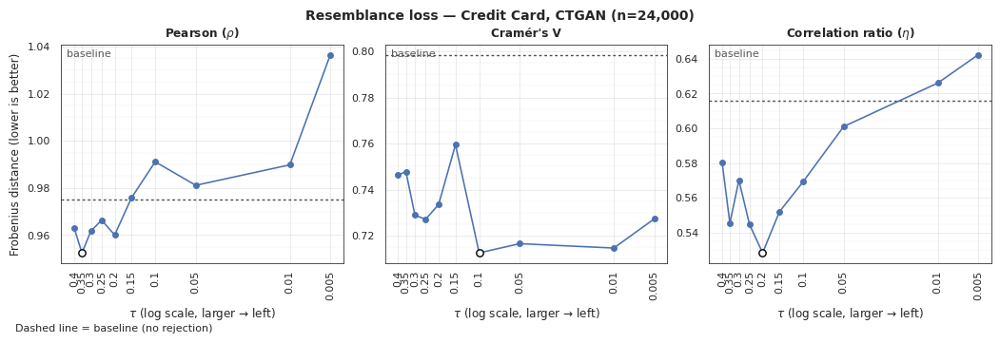

In [12]:
subset = filter_by_prefix(dict_results_credit_ctgan_heom_any, 'credit CTGAN')
plot_ressemblance_curves_notscale(subset, dataset='Credit Card',
                         generator='CTGAN',
                         sample_size=24_000)

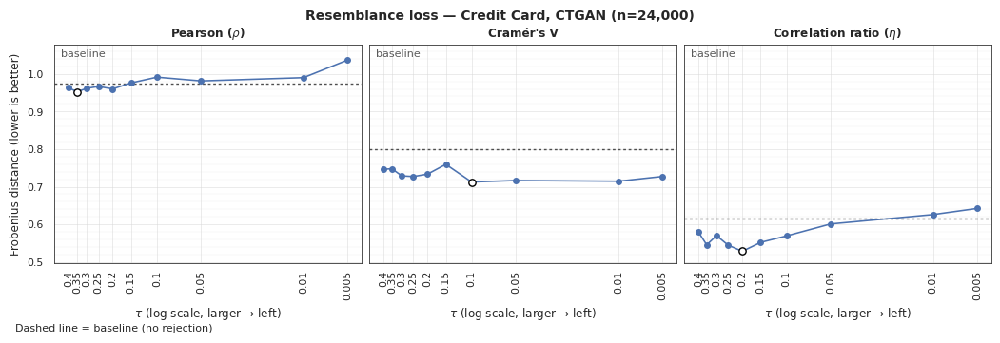

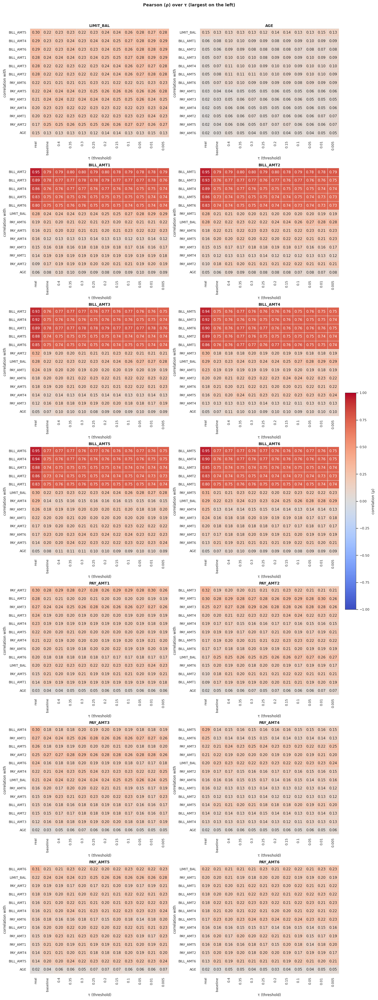

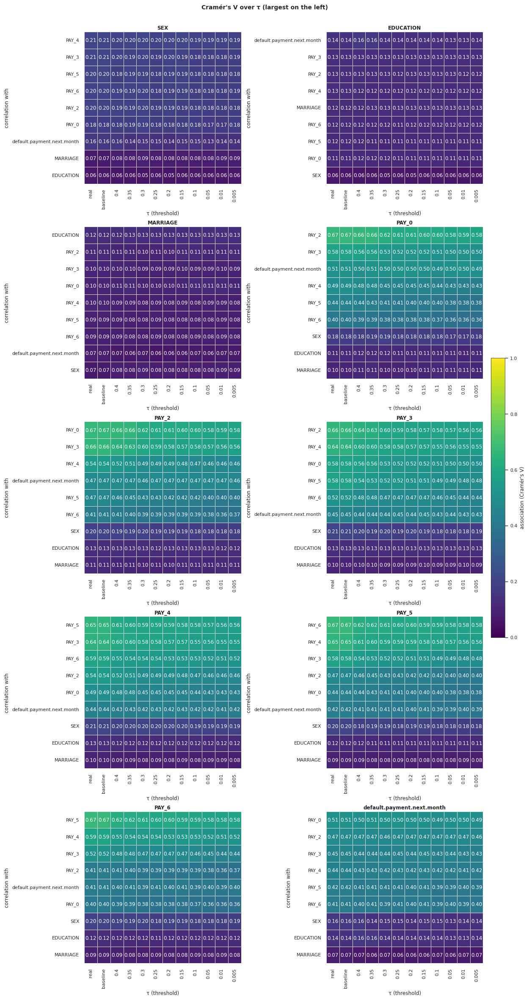

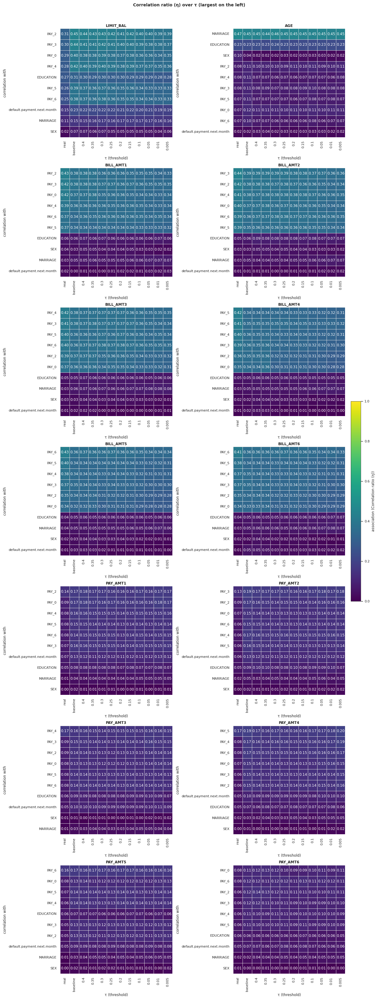

In [13]:
subset = filter_by_prefix(dict_results_credit_ctgan_heom_any, 'credit CTGAN')
plot_ressemblance_curves(subset, dataset='Credit Card',
                         generator='CTGAN',
                         sample_size=24_000)
real_pearson = dict_results_credit_ctgan_heom_any['credit CTGAN']['resemblance_evaluation_results']['numerical_multivariate']['pearson_real']
real_cramer = dict_results_credit_ctgan_heom_any['credit CTGAN']['resemblance_evaluation_results']["categorical_multivariate"]["cramer_synth"]

real_eta = dict_results_credit_ctgan_heom_any['credit CTGAN']['resemblance_evaluation_results']["categorical_numerical_multivariate"]['corr_ratio_real'][ "corr"]


plot_pearson_over_tau(dict_results_credit_ctgan_heom_any, real_pearson)
plot_cramer_over_tau(dict_results_credit_ctgan_heom_any, real_cramer)
plot_corr_ratio_over_tau(dict_results_credit_ctgan_heom_any, real_eta)

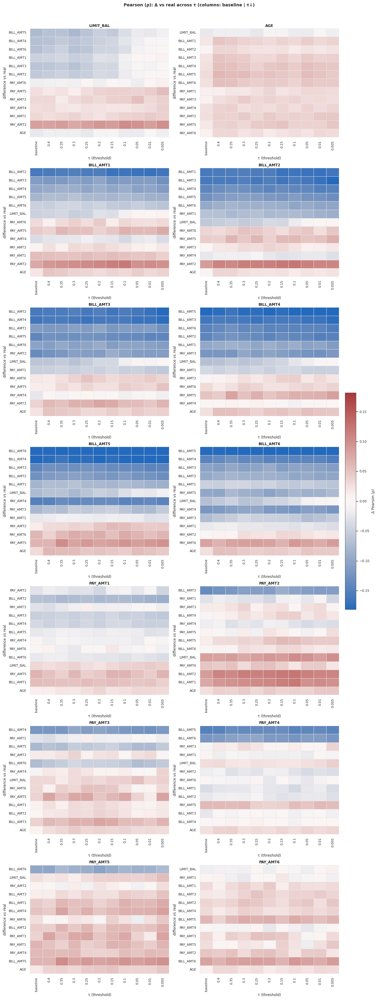

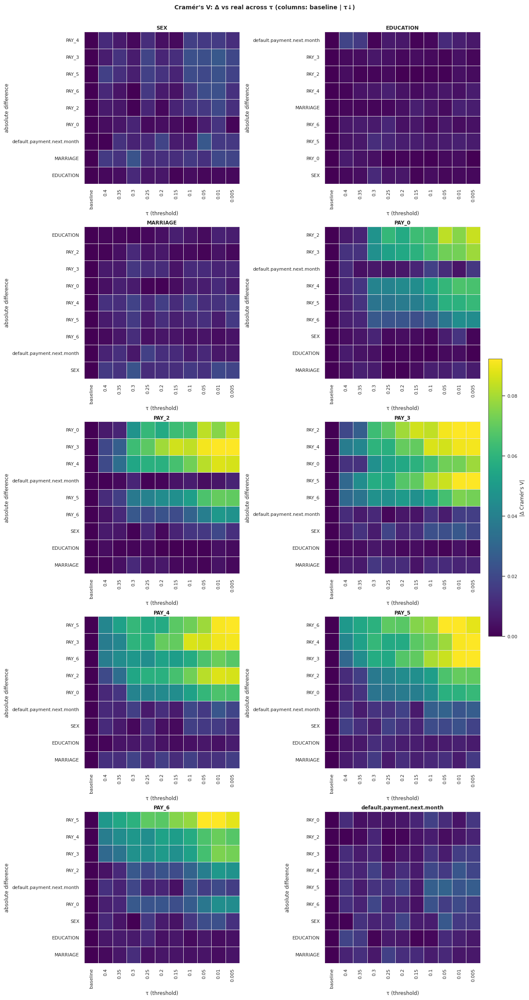

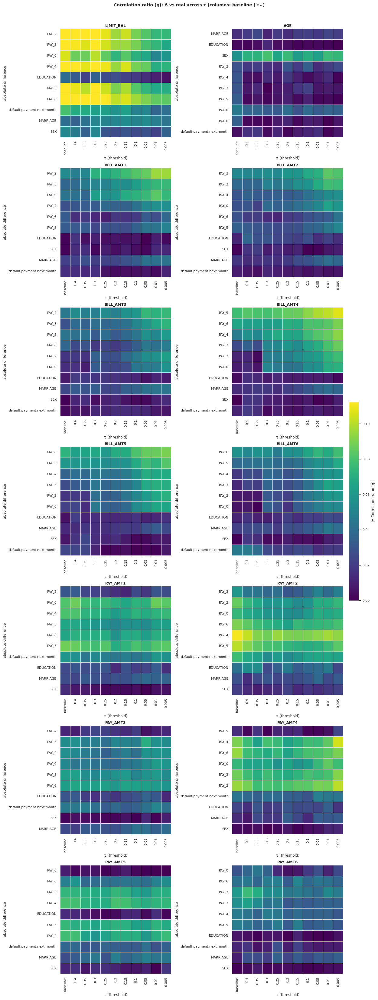

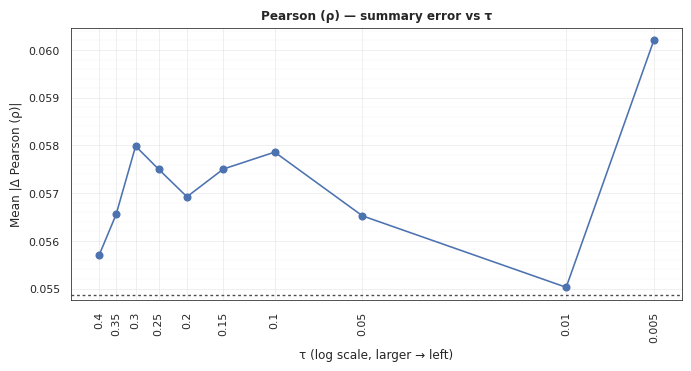

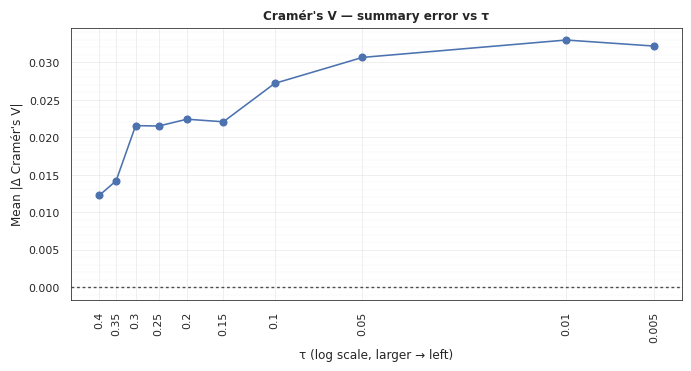

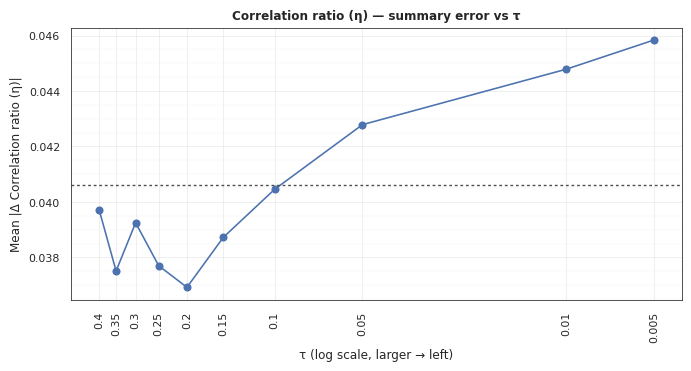

In [14]:
# Paths to your stored correlation matrices
pearson_path = ["resemblance_evaluation_results", "numerical_multivariate", "pearson_synth"]
cramer_path  = ["resemblance_evaluation_results", "categorical_multivariate", "cramer_synth"]
eta_path     = ["resemblance_evaluation_results", "categorical_numerical_multivariate", "corr_ratio_synth", "corr"]

real_pearson = dict_results_credit_ctgan_heom_any['credit CTGAN']['resemblance_evaluation_results']['numerical_multivariate']['pearson_real']
real_cramer = dict_results_credit_ctgan_heom_any['credit CTGAN']['resemblance_evaluation_results']["categorical_multivariate"]["cramer_synth"]

real_eta = dict_results_credit_ctgan_heom_any['credit CTGAN']['resemblance_evaluation_results']["categorical_numerical_multivariate"]['corr_ratio_real'][ "corr"]


# 1) Detailed Δ heatmaps (signed or absolute)
plot_delta_heatmaps_over_tau(dict_results_credit_ctgan_heom_any, real_pearson, pearson_path, "Pearson (ρ)", absolute=False)
plot_delta_heatmaps_over_tau(dict_results_credit_ctgan_heom_any, real_cramer,  cramer_path,  "Cramér's V", absolute=True)   # often nicer as |Δ|
plot_delta_heatmaps_over_tau(dict_results_credit_ctgan_heom_any, real_eta,     eta_path,     "Correlation ratio (η)", absolute=True)

# 2) One-number summary over τ (pick mae / rmse / fro)
plot_matrix_error_over_tau(dict_results_credit_ctgan_heom_any, real_pearson, pearson_path, "Pearson (ρ)", summary="mae")
plot_matrix_error_over_tau(dict_results_credit_ctgan_heom_any, real_cramer,  cramer_path,  "Cramér's V", summary="mae")
plot_matrix_error_over_tau(dict_results_credit_ctgan_heom_any, real_eta,     eta_path,     "Correlation ratio (η)", summary="mae")


In [24]:
epsilon = [ 'credit TVAE : baseline',
            'credit TVAE eps = 0.4',
            'credit TVAE eps = 0.3',
            'credit TVAE eps = 0.25',
            'credit TVAE eps = 0.2',
            'credit TVAE eps = 0.15',
            'credit TVAE eps = 0.1',
            'credit TVAE eps = 0.05',
            'credit TVAE eps = 0.01',
            'credit TVAE eps = 0.005']


print_correlation_matrices(dict_results_credit_tvae_heom_any, epsilon,'credit TVAE' )


 
 pearson correlation matrix - Real data credit TVAE : 
 

|           |   LIMIT_BAL |       AGE |   BILL_AMT1 |   BILL_AMT2 |   BILL_AMT3 |   BILL_AMT4 |   BILL_AMT5 |   BILL_AMT6 |   PAY_AMT1 |   PAY_AMT2 |   PAY_AMT3 |   PAY_AMT4 |   PAY_AMT5 |   PAY_AMT6 |
|:----------|------------:|----------:|------------:|------------:|------------:|------------:|------------:|------------:|-----------:|-----------:|-----------:|-----------:|-----------:|-----------:|
| LIMIT_BAL |    1        | 0.149027  |   0.283519  |   0.277148  |   0.28147   |    0.292581 |   0.295307  |   0.290745  |  0.195353  |  0.171262  |  0.20906   |   0.202258 |  0.218756  |  0.223813  |
| AGE       |    0.149027 | 1         |   0.0550806 |   0.054103  |   0.0526618 |    0.050386 |   0.0484248 |   0.0455981 |  0.0264485 |  0.0209453 |  0.0244853 |   0.021496 |  0.0205162 |  0.0183639 |
| BILL_AMT1 |    0.283519 | 0.0550806 |   1         |   0.951598  |   0.888002  |    0.855804 |   0.827622  |   0.800231  |  0.1377

#### Credit-TVAE

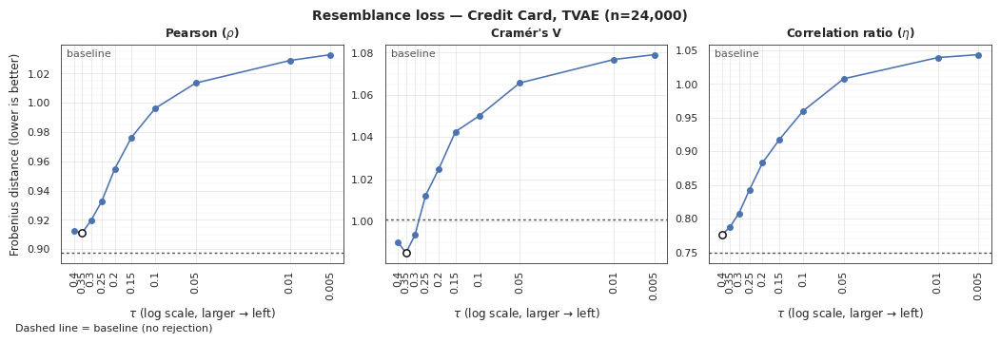

In [25]:
subset = filter_by_prefix(dict_results_credit_tvae_heom_any, 'credit TVAE')
plot_ressemblance_curves_notscale(subset, dataset='Credit Card',
                         generator='TVAE',
                         sample_size=24_000)

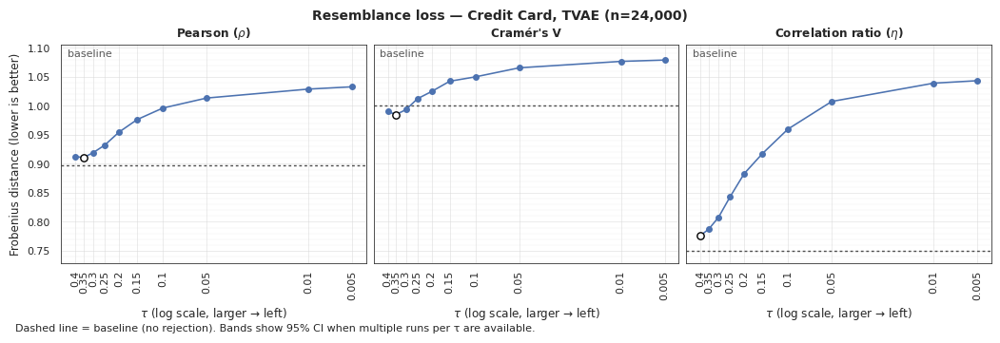

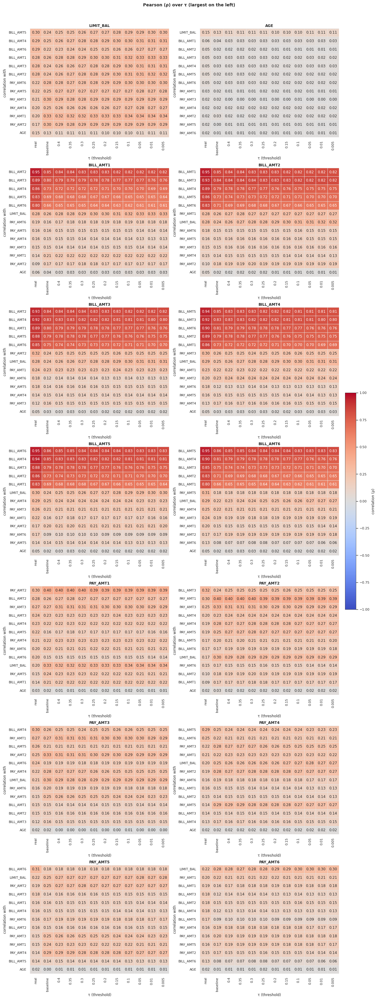

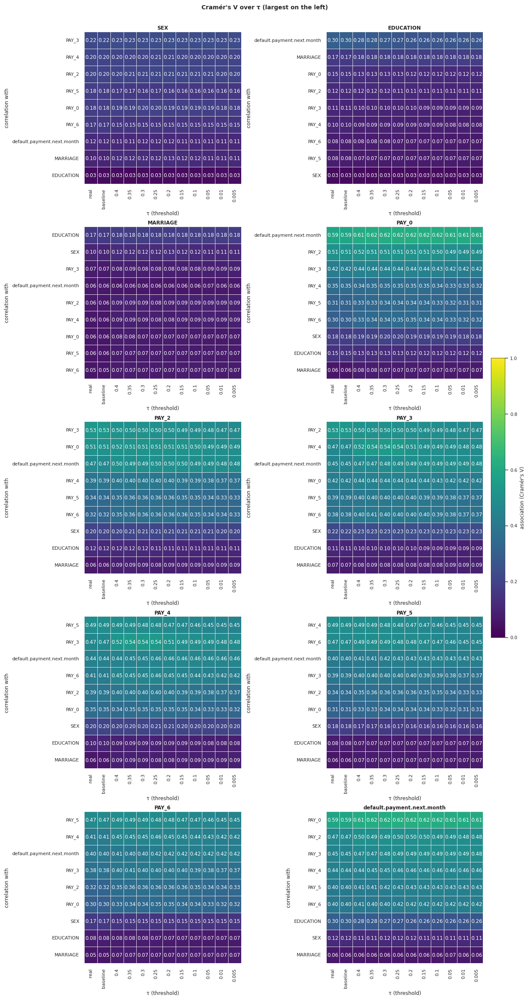

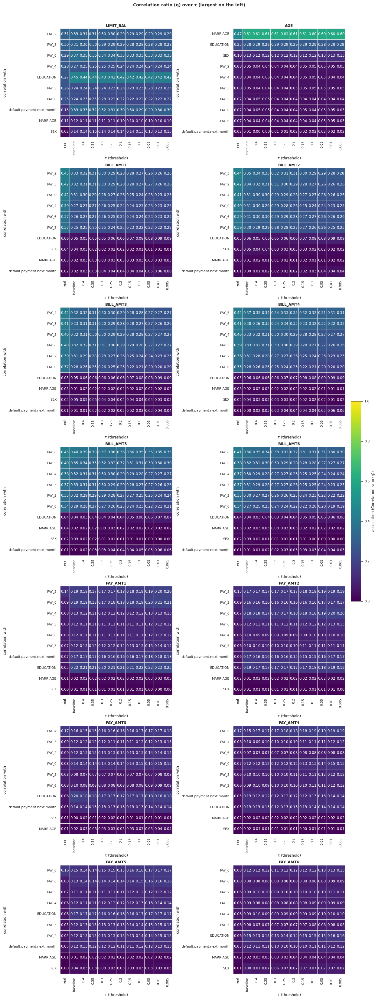

In [52]:

subset = filter_by_prefix(dict_results_credit_tvae_heom_any, 'credit TVAE')
plot_ressemblance_curves(subset, dataset='Credit Card',
                         generator='TVAE',
                         sample_size=24_000)
real_pearson = dict_results_credit_tvae_heom_any['credit TVAE']['resemblance_evaluation_results']['numerical_multivariate']['pearson_real']
real_cramer = dict_results_credit_tvae_heom_any['credit TVAE']['resemblance_evaluation_results']["categorical_multivariate"]["cramer_synth"]

real_eta = dict_results_credit_tvae_heom_any['credit TVAE']['resemblance_evaluation_results']["categorical_numerical_multivariate"]['corr_ratio_real'][ "corr"]


plot_pearson_over_tau(dict_results_credit_tvae_heom_any, real_pearson)
plot_cramer_over_tau(dict_results_credit_tvae_heom_any, real_cramer)
plot_corr_ratio_over_tau(dict_results_credit_tvae_heom_any, real_eta)

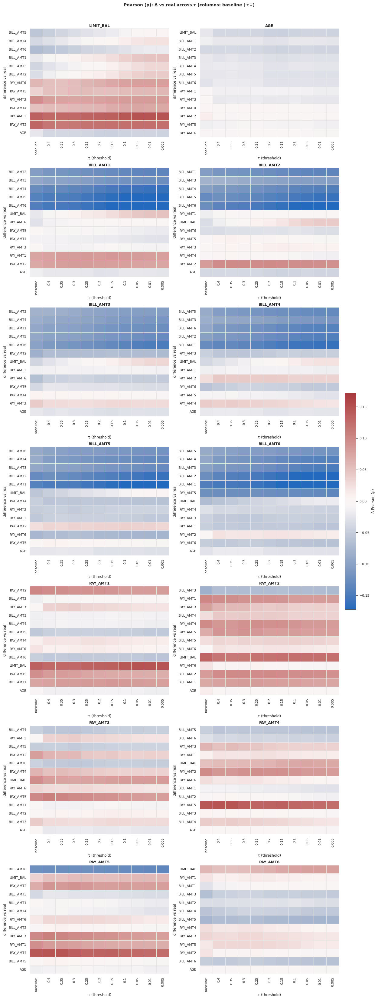

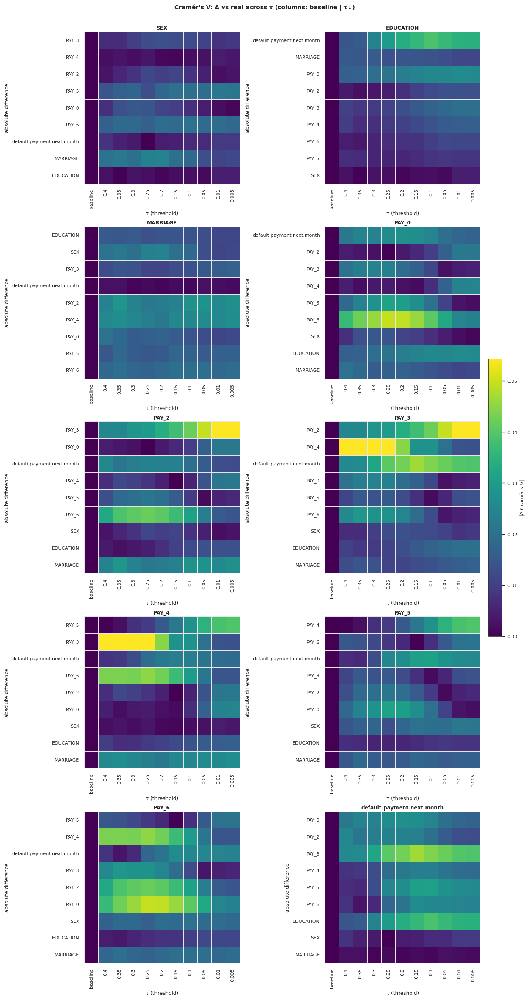

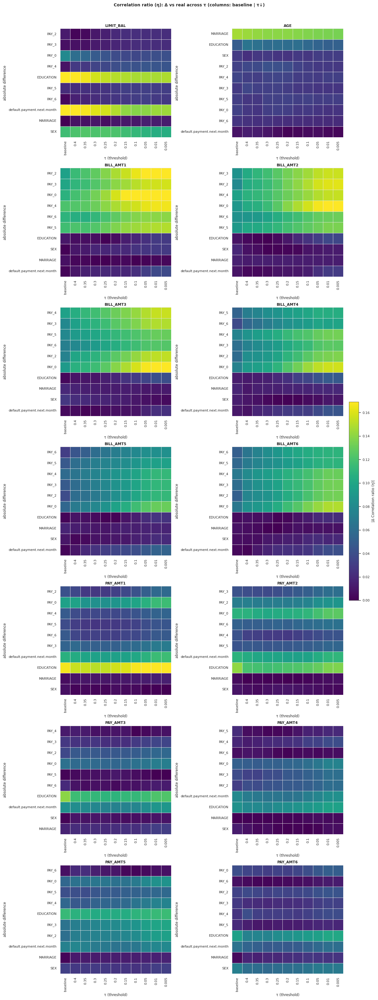

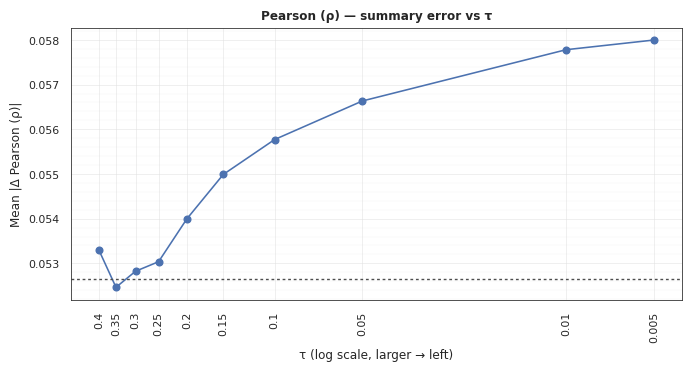

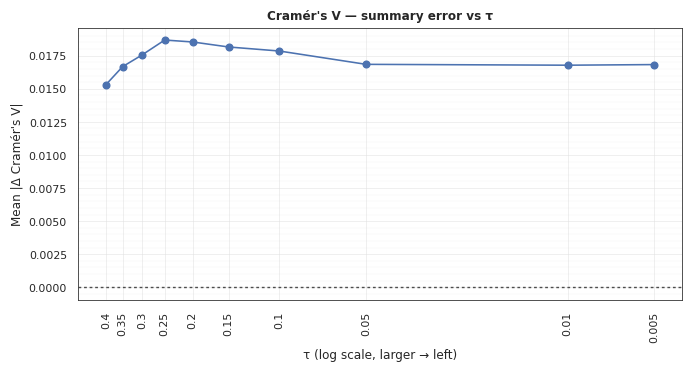

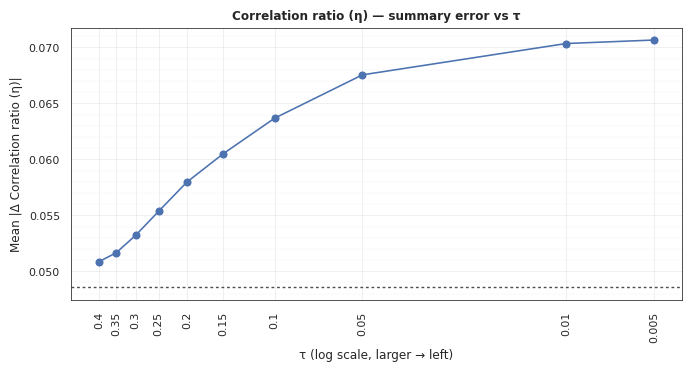

In [53]:
# Paths to your stored correlation matrices
pearson_path = ["resemblance_evaluation_results", "numerical_multivariate", "pearson_synth"]
cramer_path  = ["resemblance_evaluation_results", "categorical_multivariate", "cramer_synth"]
eta_path     = ["resemblance_evaluation_results", "categorical_numerical_multivariate", "corr_ratio_synth", "corr"]

real_pearson = dict_results_credit_tvae_heom_any['credit TVAE']['resemblance_evaluation_results']['numerical_multivariate']['pearson_real']
real_cramer = dict_results_credit_tvae_heom_any['credit TVAE']['resemblance_evaluation_results']["categorical_multivariate"]["cramer_synth"]

real_eta = dict_results_credit_tvae_heom_any['credit TVAE']['resemblance_evaluation_results']["categorical_numerical_multivariate"]['corr_ratio_real'][ "corr"]


# 1) Detailed Δ heatmaps (signed or absolute)
plot_delta_heatmaps_over_tau(dict_results_credit_tvae_heom_any, real_pearson, pearson_path, "Pearson (ρ)", absolute=False)
plot_delta_heatmaps_over_tau(dict_results_credit_tvae_heom_any, real_cramer,  cramer_path,  "Cramér's V", absolute=True)   # often nicer as |Δ|
plot_delta_heatmaps_over_tau(dict_results_credit_tvae_heom_any, real_eta,     eta_path,     "Correlation ratio (η)", absolute=True)

# 2) One-number summary over τ (pick mae / rmse / fro)
plot_matrix_error_over_tau(dict_results_credit_tvae_heom_any, real_pearson, pearson_path, "Pearson (ρ)", summary="mae")
plot_matrix_error_over_tau(dict_results_credit_tvae_heom_any, real_cramer,  cramer_path,  "Cramér's V", summary="mae")
plot_matrix_error_over_tau(dict_results_credit_tvae_heom_any, real_eta,     eta_path,     "Correlation ratio (η)", summary="mae")


### Adult

#### Adult-CTGAN

In [16]:
epsilon = [ 'adult CTGAN : baseline',
            'adult CTGAN eps = 0.4',
            'adult CTGAN eps = 0.35',
            'adult CTGAN eps = 0.3',
            'adult CTGAN eps = 0.25',
            'adult CTGAN eps = 0.2',
            'adult CTGAN eps = 0.15',
            'adult CTGAN eps = 0.1',
            'adult CTGAN eps = 0.05',
            'adult CTGAN eps = 0.01',
            'adult CTGAN eps = 0.005']


print_correlation_matrices(dict_results_adult_ctgan_heom_any, epsilon, 'adult CTGAN')




 
 pearson correlation matrix - Real data adult CTGAN : 
 

|                |       age |      fnlwgt |   education-num |   capital-gain |   capital-loss |   hours-per-week |
|:---------------|----------:|------------:|----------------:|---------------:|---------------:|-----------------:|
| age            | 1         | 0.0766459   |       0.0365272 |    0.0776745   |      0.0577745 |        0.0687557 |
| fnlwgt         | 0.0766459 | 1           |       0.0431946 |    0.000431886 |      0.0102517 |        0.0187685 |
| education-num  | 0.0365272 | 0.0431946   |       1         |    0.12263     |      0.079923  |        0.148123  |
| capital-gain   | 0.0776745 | 0.000431886 |       0.12263   |    1           |      0.0316151 |        0.0784086 |
| capital-loss   | 0.0577745 | 0.0102517   |       0.079923  |    0.0316151   |      1         |        0.0542564 |
| hours-per-week | 0.0687557 | 0.0187685   |       0.148123  |    0.0784086   |      0.0542564 |        1         |

 
 cramer 

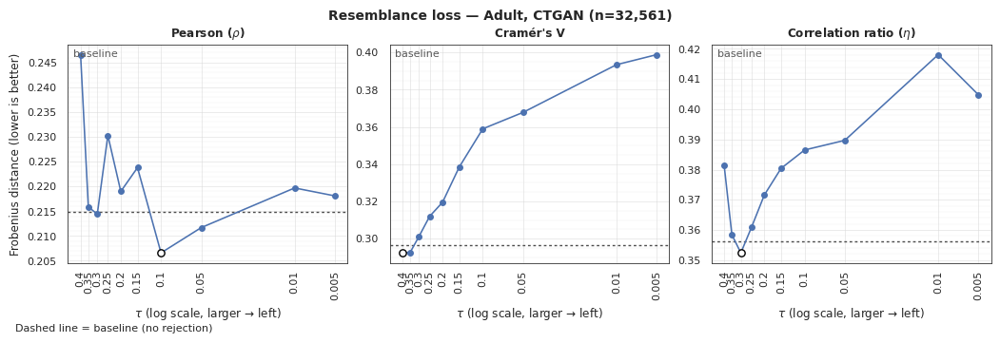

In [26]:
subset = filter_by_prefix(dict_results_adult_ctgan_heom_any, 'adult CTGAN')
plot_ressemblance_curves_notscale(subset, dataset='Adult',
                         generator='CTGAN',
                         sample_size=32561)

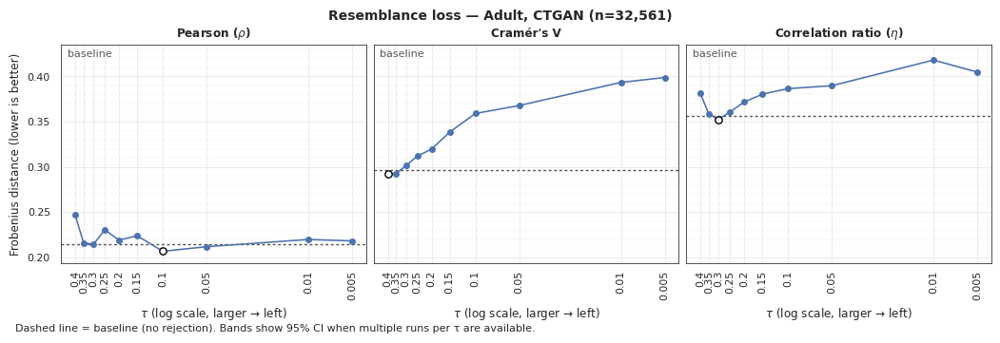

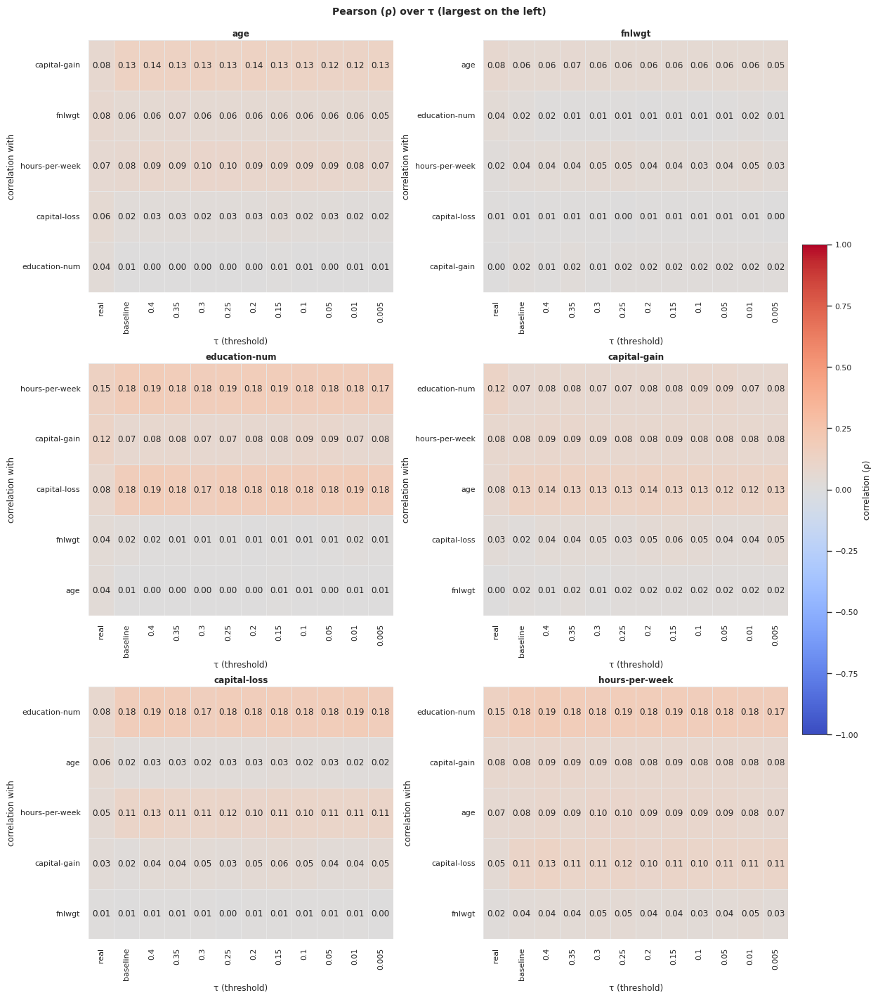

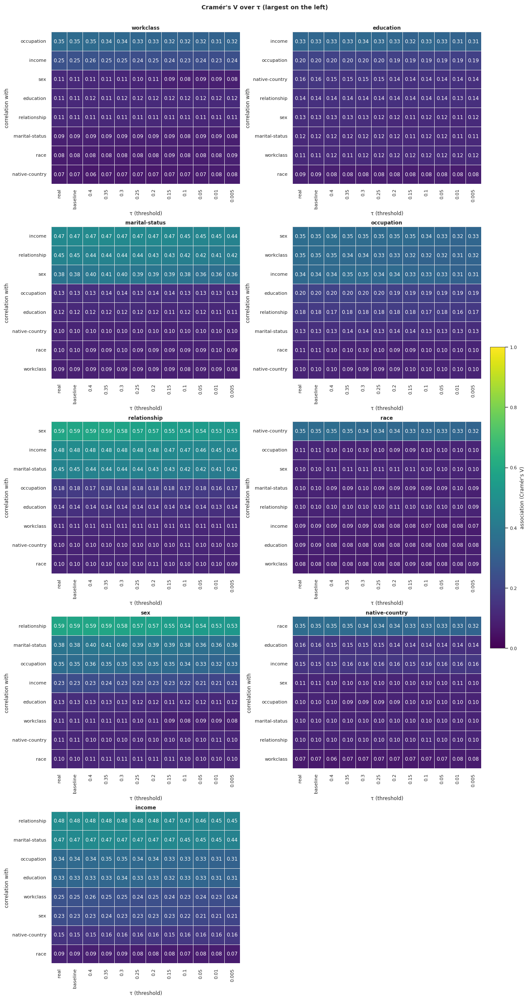

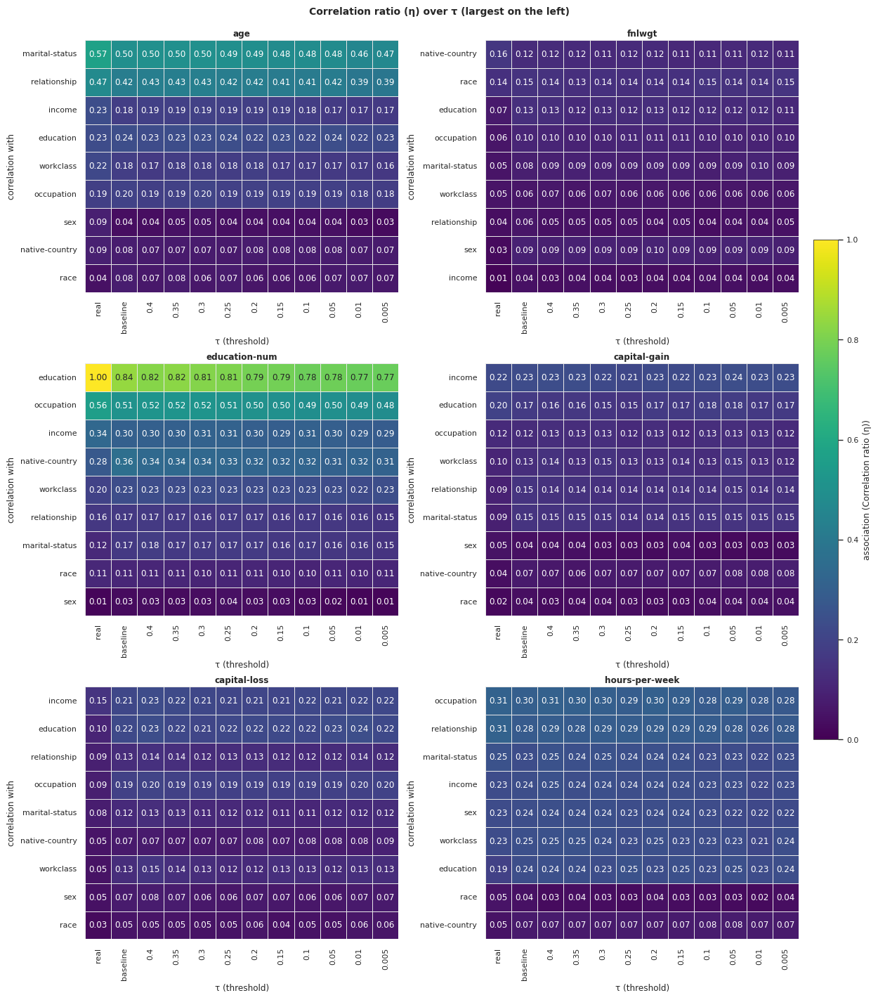

In [56]:

subset = filter_by_prefix(dict_results_adult_ctgan_heom_any, 'adult CTGAN')
plot_ressemblance_curves(subset, dataset='Adult',
                         generator='CTGAN',
                         sample_size=32561)
real_pearson = dict_results_adult_ctgan_heom_any['adult CTGAN']['resemblance_evaluation_results']['numerical_multivariate']['pearson_real']
real_cramer = dict_results_adult_ctgan_heom_any['adult CTGAN']['resemblance_evaluation_results']["categorical_multivariate"]["cramer_synth"]

real_eta = dict_results_adult_ctgan_heom_any['adult CTGAN']['resemblance_evaluation_results']["categorical_numerical_multivariate"]['corr_ratio_real'][ "corr"]


plot_pearson_over_tau(dict_results_adult_ctgan_heom_any, real_pearson)
plot_cramer_over_tau(dict_results_adult_ctgan_heom_any, real_cramer)
plot_corr_ratio_over_tau(dict_results_adult_ctgan_heom_any, real_eta)

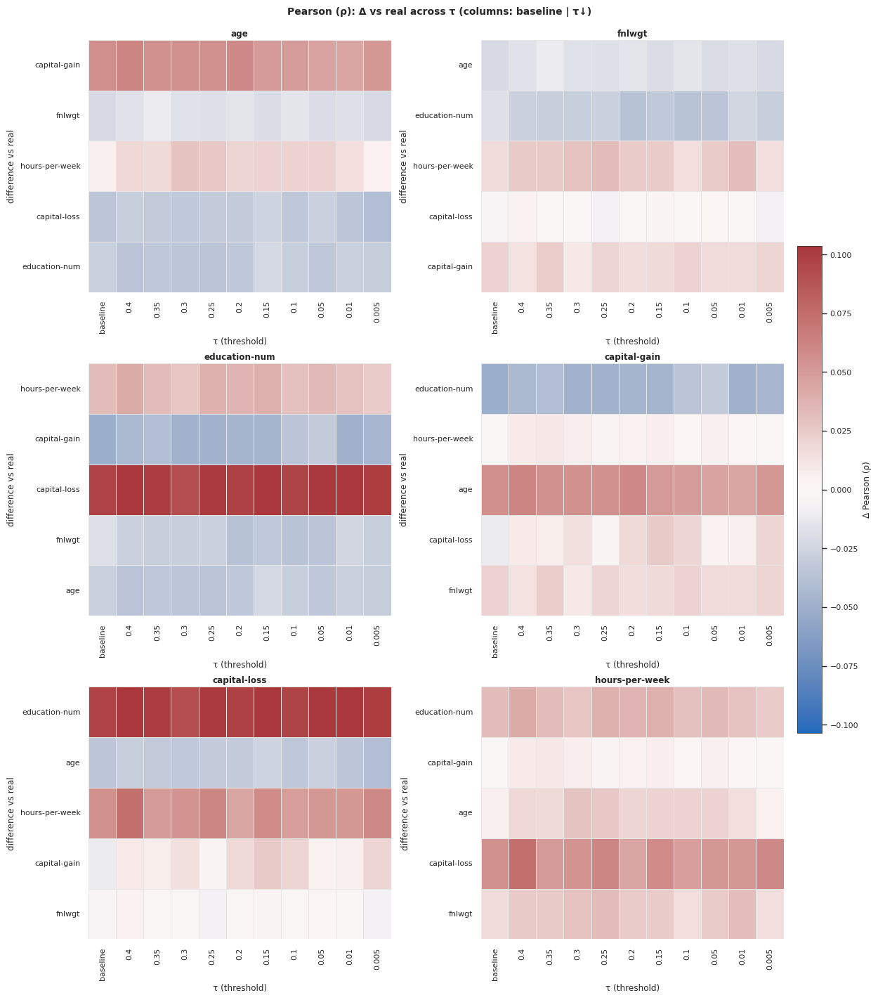

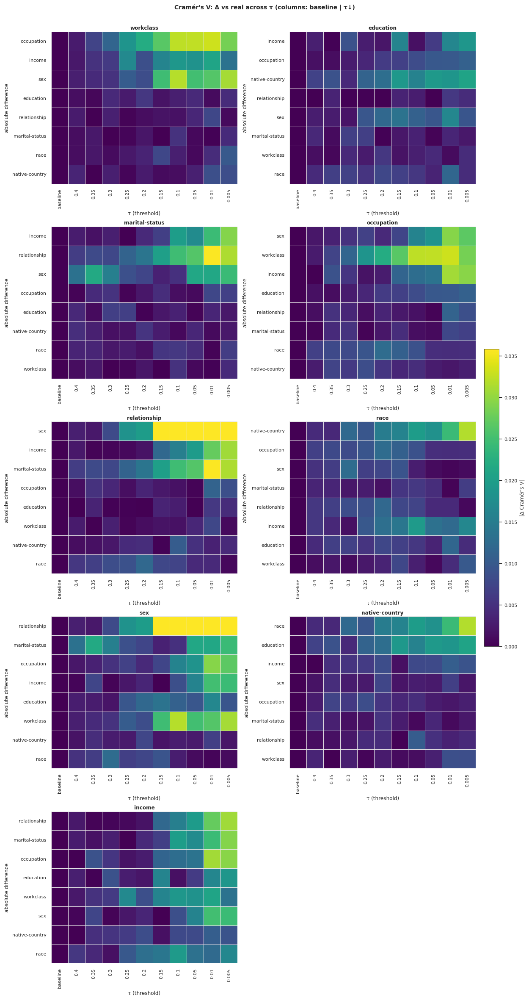

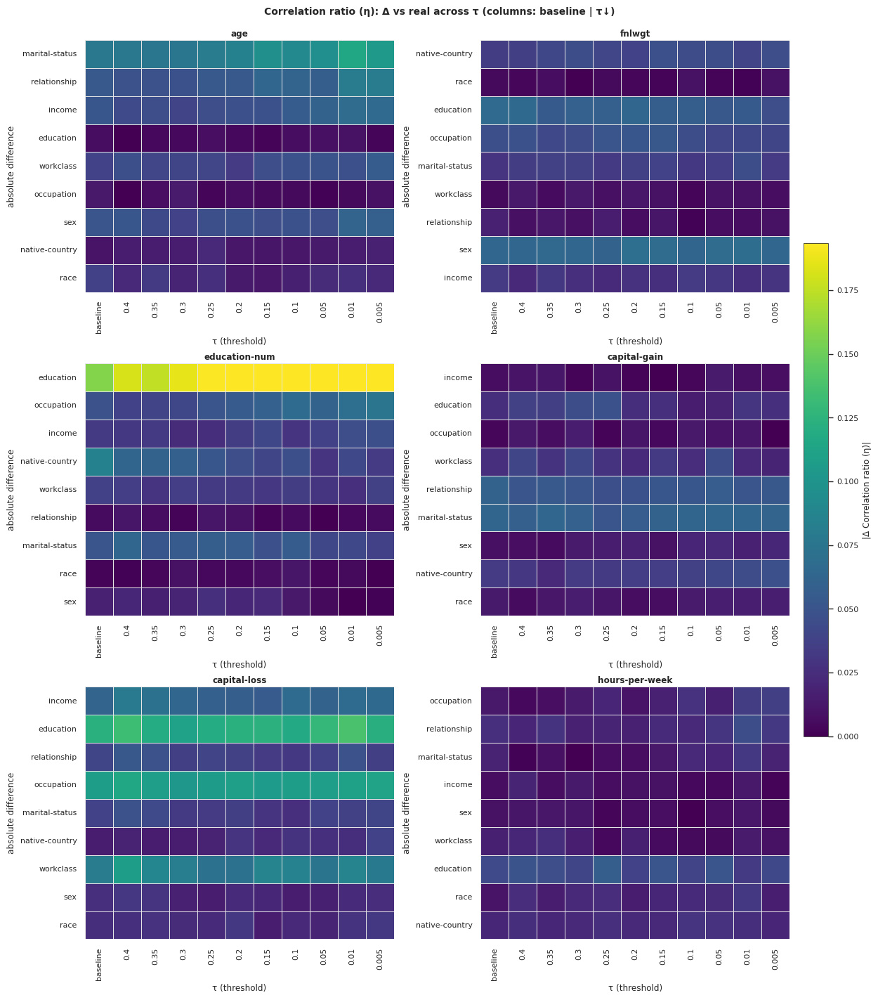

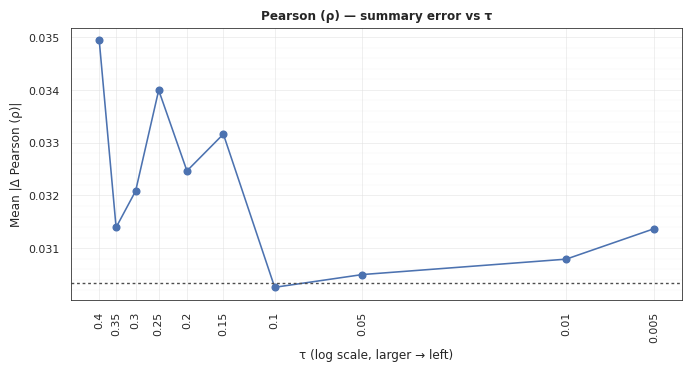

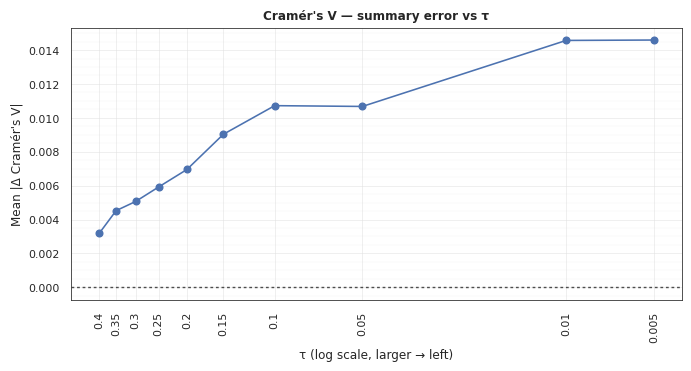

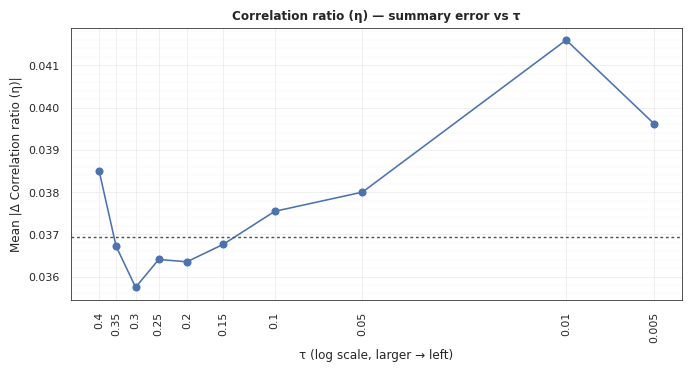

In [59]:
# Paths to your stored correlation matrices
pearson_path = ["resemblance_evaluation_results", "numerical_multivariate", "pearson_synth"]
cramer_path  = ["resemblance_evaluation_results", "categorical_multivariate", "cramer_synth"]
eta_path     = ["resemblance_evaluation_results", "categorical_numerical_multivariate", "corr_ratio_synth", "corr"]

real_pearson = dict_results_adult_ctgan_heom_any['adult CTGAN']['resemblance_evaluation_results']['numerical_multivariate']['pearson_real']
real_cramer = dict_results_adult_ctgan_heom_any['adult CTGAN']['resemblance_evaluation_results']["categorical_multivariate"]["cramer_synth"]

real_eta = dict_results_adult_ctgan_heom_any['adult CTGAN']['resemblance_evaluation_results']["categorical_numerical_multivariate"]['corr_ratio_real'][ "corr"]


# 1) Detailed Δ heatmaps (signed or absolute)
plot_delta_heatmaps_over_tau(dict_results_adult_ctgan_heom_any, real_pearson, pearson_path, "Pearson (ρ)", absolute=False)
plot_delta_heatmaps_over_tau(dict_results_adult_ctgan_heom_any, real_cramer,  cramer_path,  "Cramér's V", absolute=True)   # often nicer as |Δ|
plot_delta_heatmaps_over_tau(dict_results_adult_ctgan_heom_any, real_eta,     eta_path,     "Correlation ratio (η)", absolute=True)

# 2) One-number summary over τ (pick mae / rmse / fro)
plot_matrix_error_over_tau(dict_results_adult_ctgan_heom_any, real_pearson, pearson_path, "Pearson (ρ)", summary="mae")
plot_matrix_error_over_tau(dict_results_adult_ctgan_heom_any, real_cramer,  cramer_path,  "Cramér's V", summary="mae")
plot_matrix_error_over_tau(dict_results_adult_ctgan_heom_any, real_eta,     eta_path,     "Correlation ratio (η)", summary="mae")


#### Adult-TVAE

In [17]:
epsilon = [ 'adult TVAE : baseline',
            'adult TVAE eps = 0.4',
            'adult TVAE eps = 0.35',
            'adult TVAE eps = 0.3',
            'adult TVAE eps = 0.25',
            'adult TVAE eps = 0.2',
            'adult TVAE eps = 0.15',
            'adult TVAE eps = 0.1',
            'adult TVAE eps = 0.05',
            'adult TVAE eps = 0.01',
            'adult TVAE eps = 0.005']


print_correlation_matrices(dict_results_adult_tvae_heom_any, epsilon, 'adult TVAE')


 
 pearson correlation matrix - Real data adult TVAE : 
 

|                |       age |      fnlwgt |   education-num |   capital-gain |   capital-loss |   hours-per-week |
|:---------------|----------:|------------:|----------------:|---------------:|---------------:|-----------------:|
| age            | 1         | 0.0766459   |       0.0365272 |    0.0776745   |      0.0577745 |        0.0687557 |
| fnlwgt         | 0.0766459 | 1           |       0.0431946 |    0.000431886 |      0.0102517 |        0.0187685 |
| education-num  | 0.0365272 | 0.0431946   |       1         |    0.12263     |      0.079923  |        0.148123  |
| capital-gain   | 0.0776745 | 0.000431886 |       0.12263   |    1           |      0.0316151 |        0.0784086 |
| capital-loss   | 0.0577745 | 0.0102517   |       0.079923  |    0.0316151   |      1         |        0.0542564 |
| hours-per-week | 0.0687557 | 0.0187685   |       0.148123  |    0.0784086   |      0.0542564 |        1         |

 
 cramer c

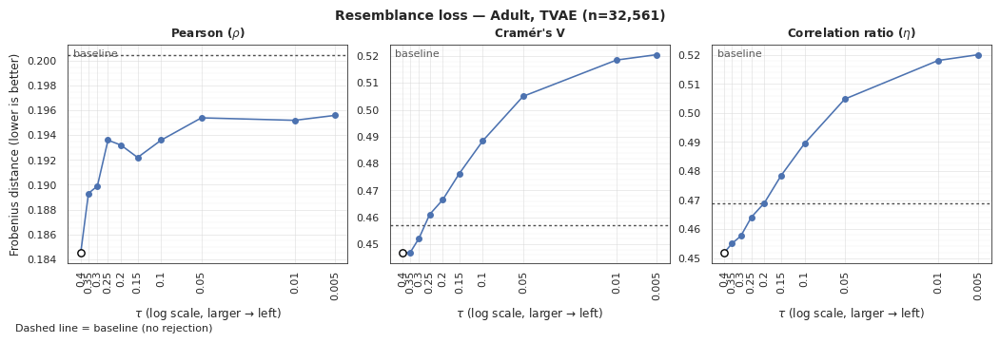

In [27]:
subset = filter_by_prefix(dict_results_adult_tvae_heom_any, 'adult TVAE')
plot_ressemblance_curves_notscale(subset, dataset='Adult',
                         generator='TVAE',
                         sample_size=32561)

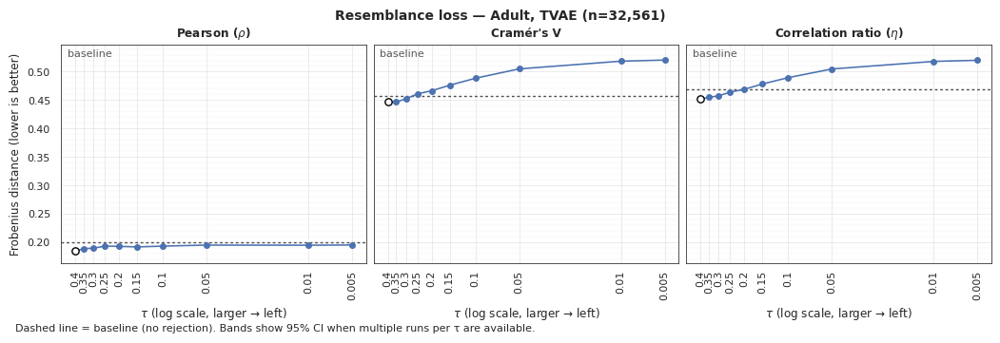

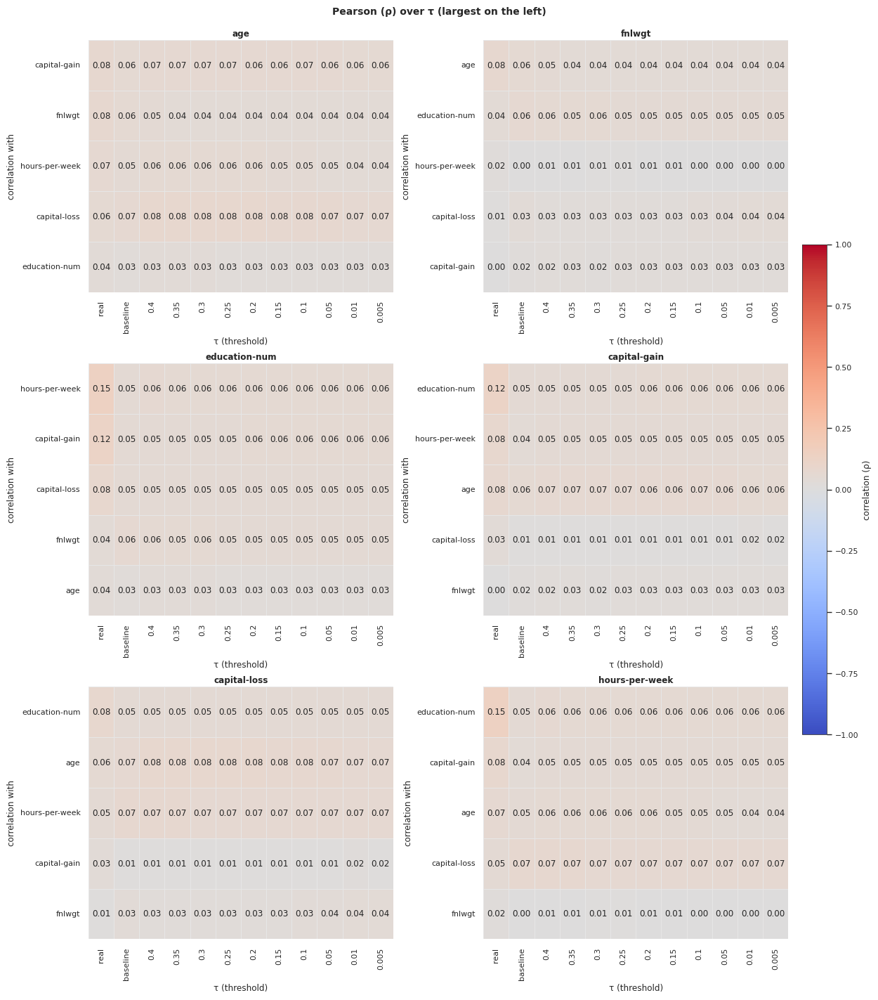

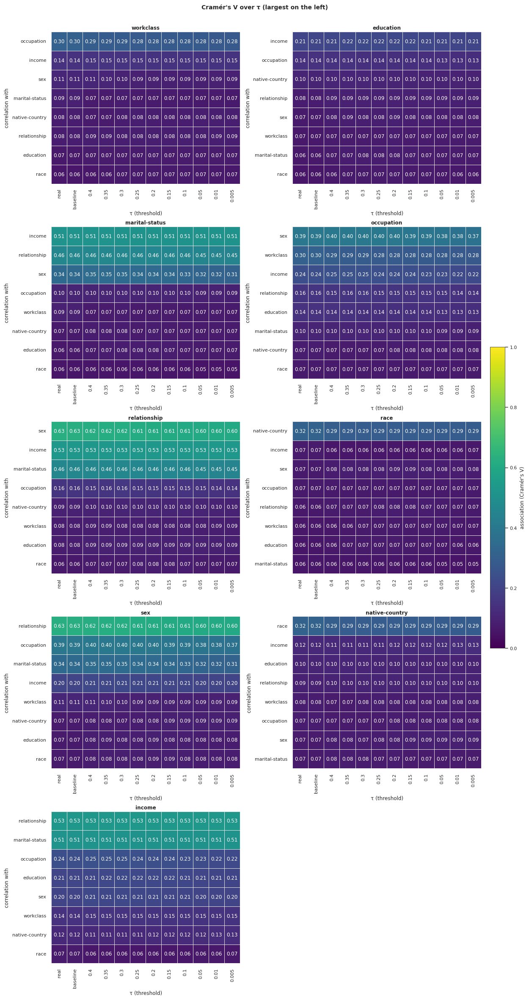

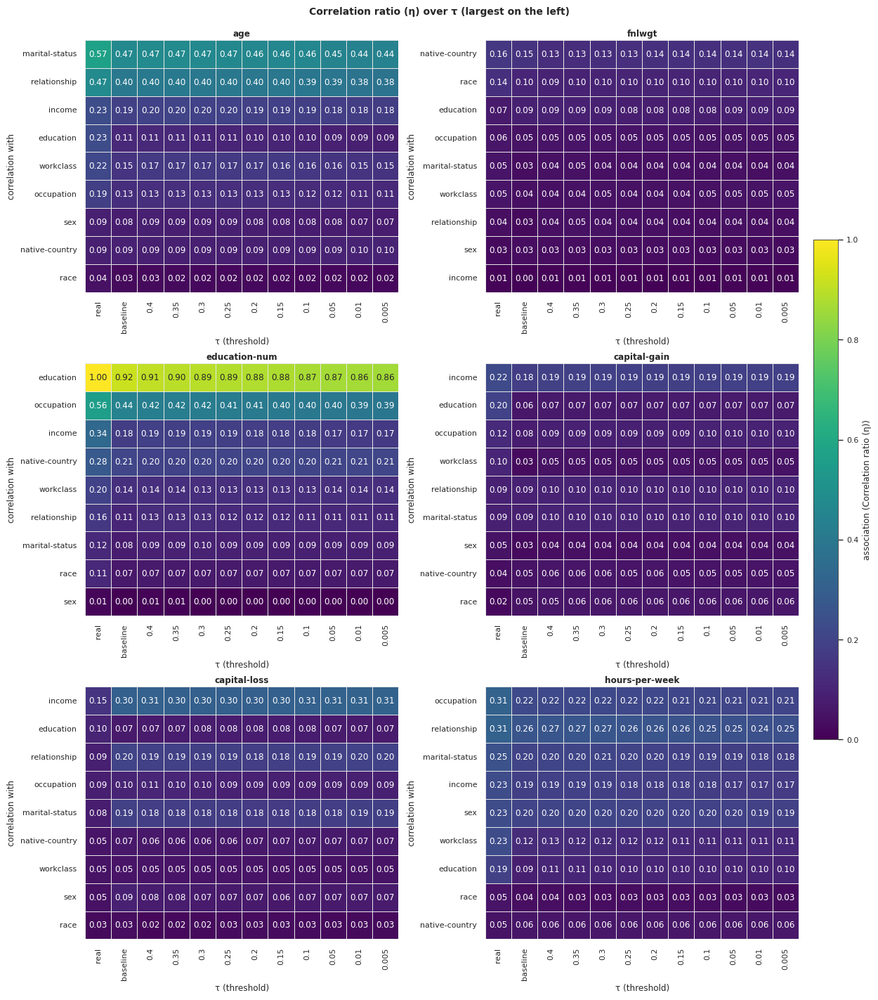

In [58]:
subset = filter_by_prefix(dict_results_adult_tvae_heom_any, 'adult TVAE')
plot_ressemblance_curves(subset, dataset='Adult',
                         generator='TVAE',
                         sample_size=32561)
real_pearson = dict_results_adult_tvae_heom_any['adult TVAE']['resemblance_evaluation_results']['numerical_multivariate']['pearson_real']
real_cramer = dict_results_adult_tvae_heom_any['adult TVAE']['resemblance_evaluation_results']["categorical_multivariate"]["cramer_synth"]

real_eta = dict_results_adult_tvae_heom_any['adult TVAE']['resemblance_evaluation_results']["categorical_numerical_multivariate"]['corr_ratio_real'][ "corr"]


plot_pearson_over_tau(dict_results_adult_tvae_heom_any, real_pearson)
plot_cramer_over_tau(dict_results_adult_tvae_heom_any, real_cramer)
plot_corr_ratio_over_tau(dict_results_adult_tvae_heom_any, real_eta)

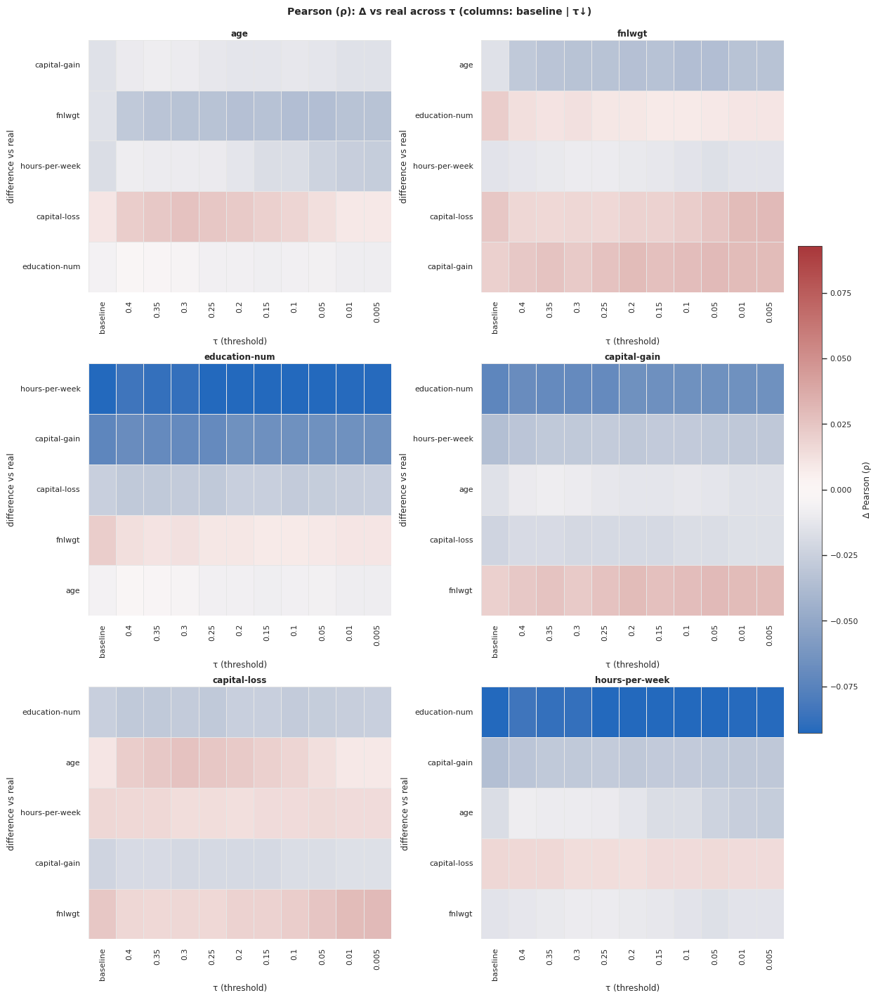

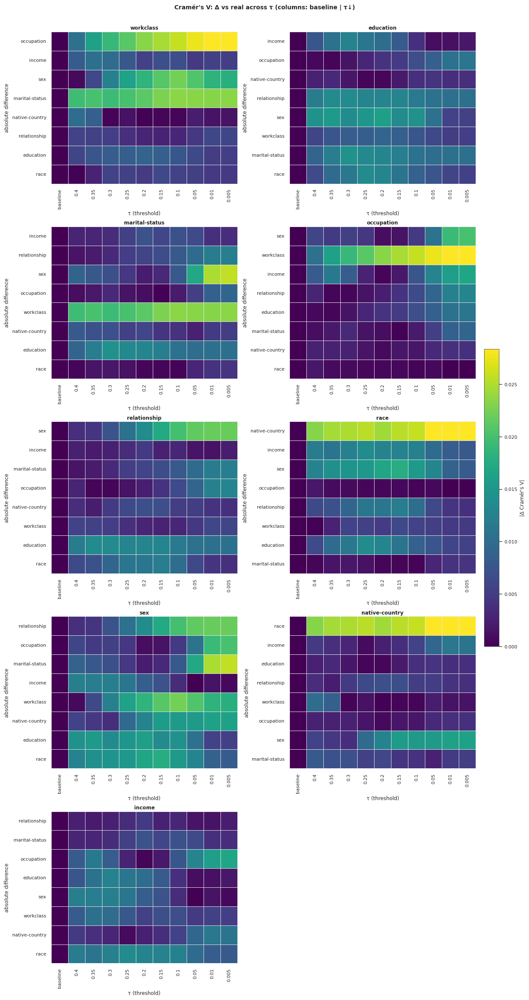

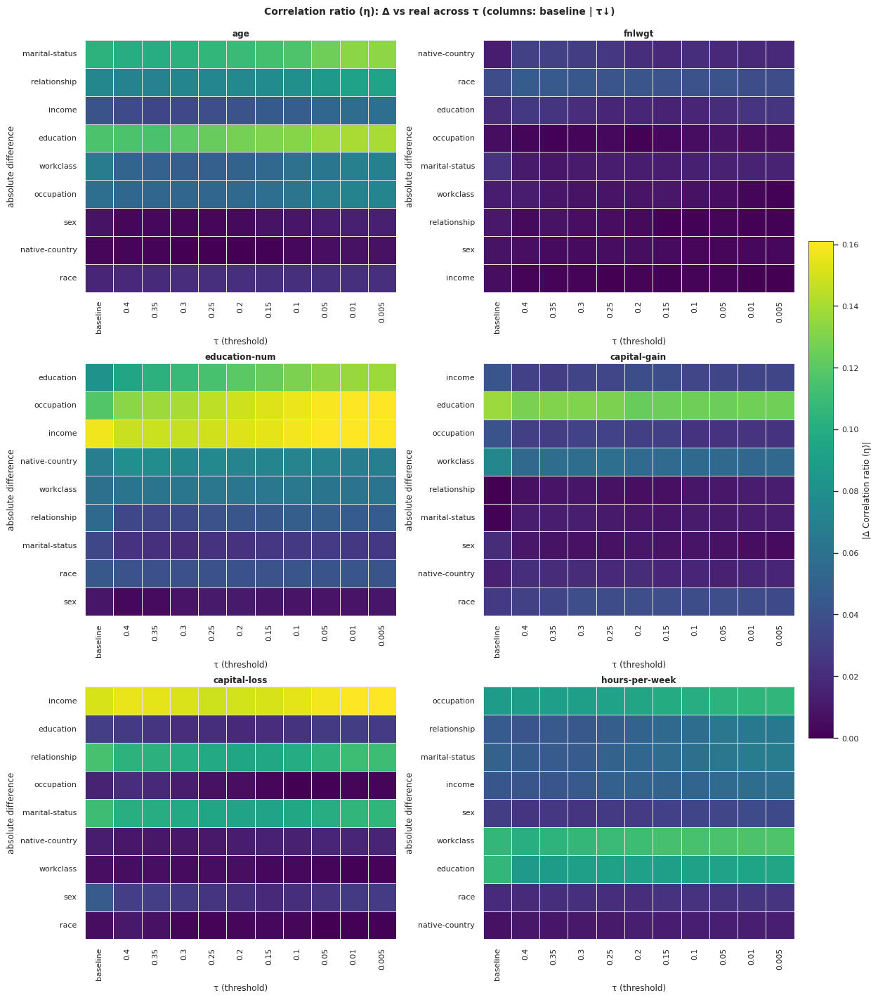

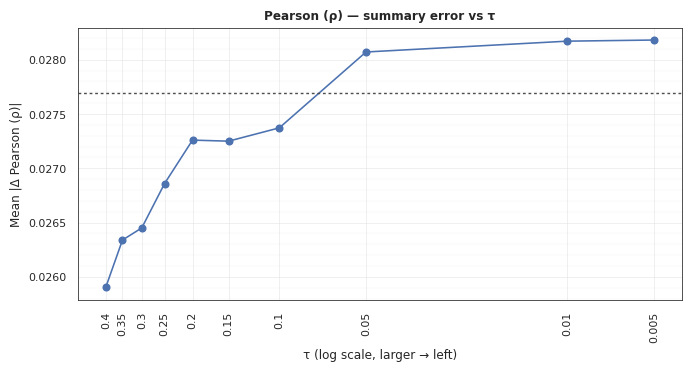

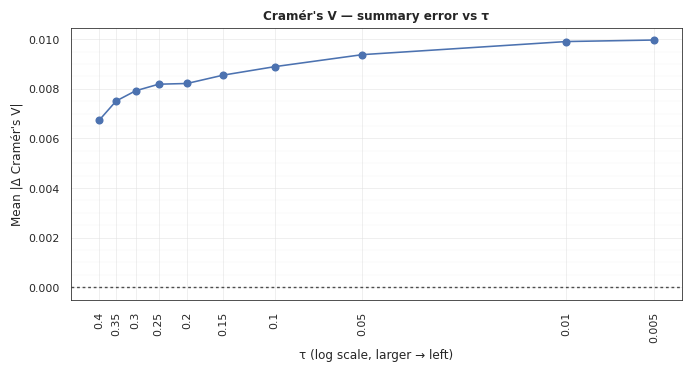

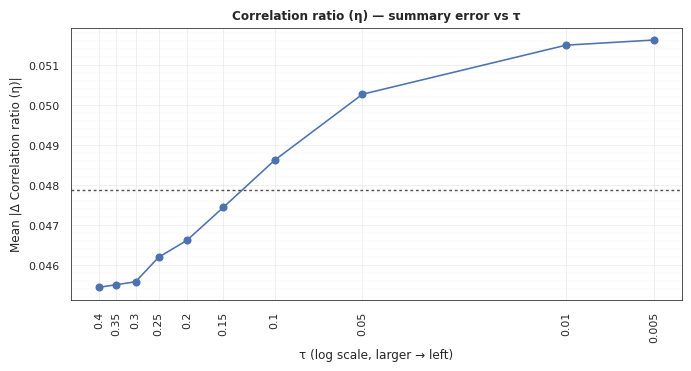

In [60]:
# Paths to your stored correlation matrices
pearson_path = ["resemblance_evaluation_results", "numerical_multivariate", "pearson_synth"]
cramer_path  = ["resemblance_evaluation_results", "categorical_multivariate", "cramer_synth"]
eta_path     = ["resemblance_evaluation_results", "categorical_numerical_multivariate", "corr_ratio_synth", "corr"]

real_pearson = dict_results_adult_tvae_heom_any['adult TVAE']['resemblance_evaluation_results']['numerical_multivariate']['pearson_real']
real_cramer = dict_results_adult_tvae_heom_any['adult TVAE']['resemblance_evaluation_results']["categorical_multivariate"]["cramer_synth"]

real_eta = dict_results_adult_tvae_heom_any['adult TVAE']['resemblance_evaluation_results']["categorical_numerical_multivariate"]['corr_ratio_real'][ "corr"]


# 1) Detailed Δ heatmaps (signed or absolute)
plot_delta_heatmaps_over_tau(dict_results_adult_tvae_heom_any, real_pearson, pearson_path, "Pearson (ρ)", absolute=False)
plot_delta_heatmaps_over_tau(dict_results_adult_tvae_heom_any, real_cramer,  cramer_path,  "Cramér's V", absolute=True)   # often nicer as |Δ|
plot_delta_heatmaps_over_tau(dict_results_adult_tvae_heom_any, real_eta,     eta_path,     "Correlation ratio (η)", absolute=True)

# 2) One-number summary over τ (pick mae / rmse / fro)
plot_matrix_error_over_tau(dict_results_adult_tvae_heom_any, real_pearson, pearson_path, "Pearson (ρ)", summary="mae")
plot_matrix_error_over_tau(dict_results_adult_tvae_heom_any, real_cramer,  cramer_path,  "Cramér's V", summary="mae")
plot_matrix_error_over_tau(dict_results_adult_tvae_heom_any, real_eta,     eta_path,     "Correlation ratio (η)", summary="mae")


### Cardio

#### Cardio-CTGAN

In [38]:
epsilon = [ 'cardio CTGAN : baseline',
            'cardio CTGAN eps = 0.4',
            'cardio CTGAN eps = 0.35',
            'cardio CTGAN eps = 0.3',
            'cardio CTGAN eps = 0.25',
            'cardio CTGAN eps = 0.2',
            'cardio CTGAN eps = 0.15',
            'cardio CTGAN eps = 0.1',
            'cardio CTGAN eps = 0.05',
            'cardio CTGAN eps = 0.01',
            'cardio CTGAN eps = 0.005']


print_correlation_matrices(dict_results_cardio_ctgan_heom_any, epsilon, 'cardio CTGAN')




 
 pearson correlation matrix - Real data cardio CTGAN : 
 

|        |       age |     height |    weight |      ap_hi |      ap_lo |
|:-------|----------:|-----------:|----------:|-----------:|-----------:|
| age    | 1         | 0.080918   | 0.0542576 | 0.0229107  | 0.0195496  |
| height | 0.080918  | 1          | 0.291467  | 0.00716016 | 0.00951837 |
| weight | 0.0542576 | 0.291467   | 1         | 0.030205   | 0.0455419  |
| ap_hi  | 0.0229107 | 0.00716016 | 0.030205  | 1          | 0.015152   |
| ap_lo  | 0.0195496 | 0.00951837 | 0.0455419 | 0.015152   | 1          |

 
 cramer correlation matrix - Real data cardio CTGAN : 
 

|             |     gender |   cholesterol |      gluc |     smoke |       alco |     active |     cardio |
|:------------|-----------:|--------------:|----------:|----------:|-----------:|-----------:|-----------:|
| gender      | 1          |     0.0401824 | 0.0200795 | 0.336965  | 0.168797   | 0.00427168 | 0.00712564 |
| cholesterol | 0.0401824  |     1 

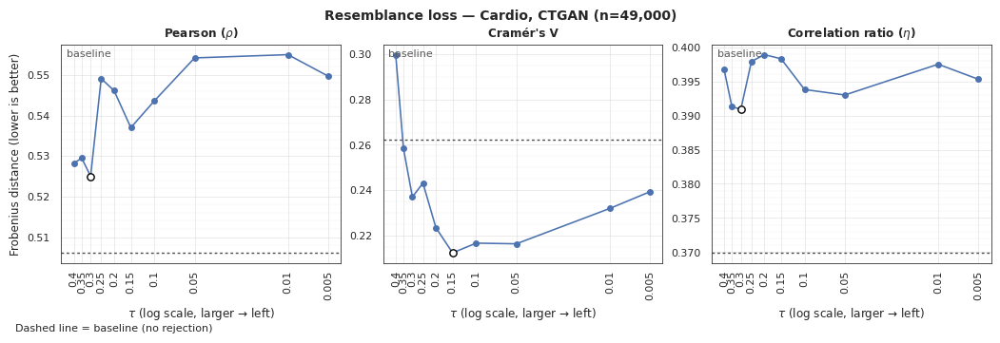

In [28]:
subset = filter_by_prefix(dict_results_cardio_ctgan_heom_any, 'cardio CTGAN')
plot_ressemblance_curves_notscale(subset, dataset='Cardio',
                         generator='CTGAN',
                         sample_size=49000)

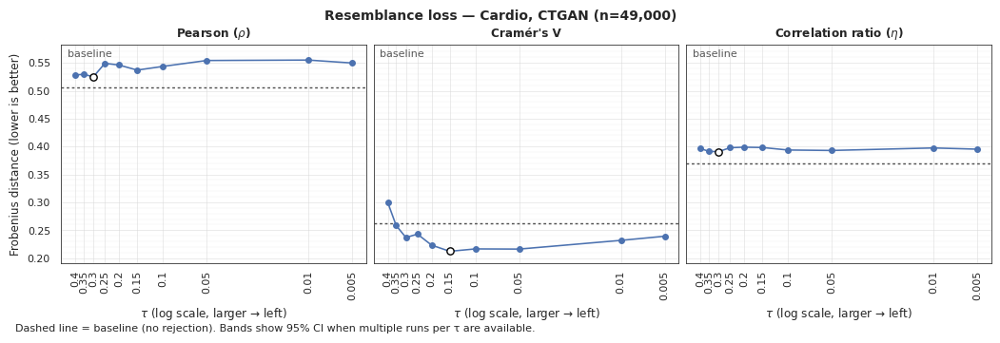

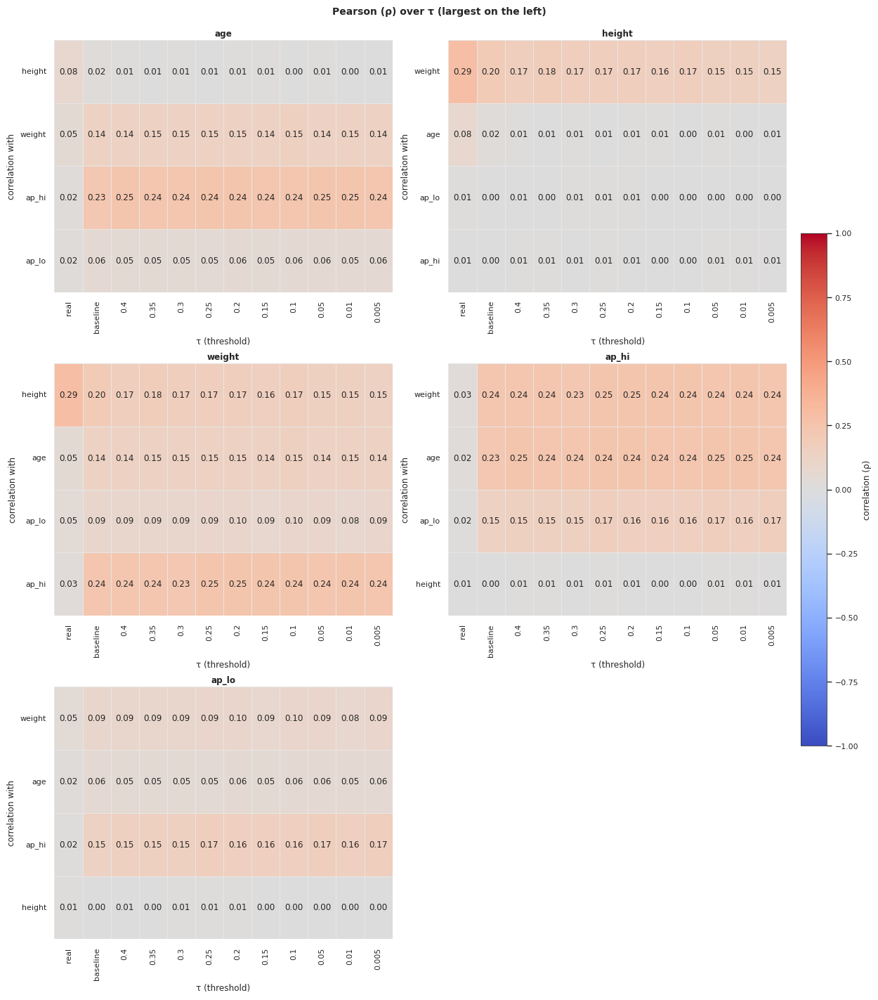

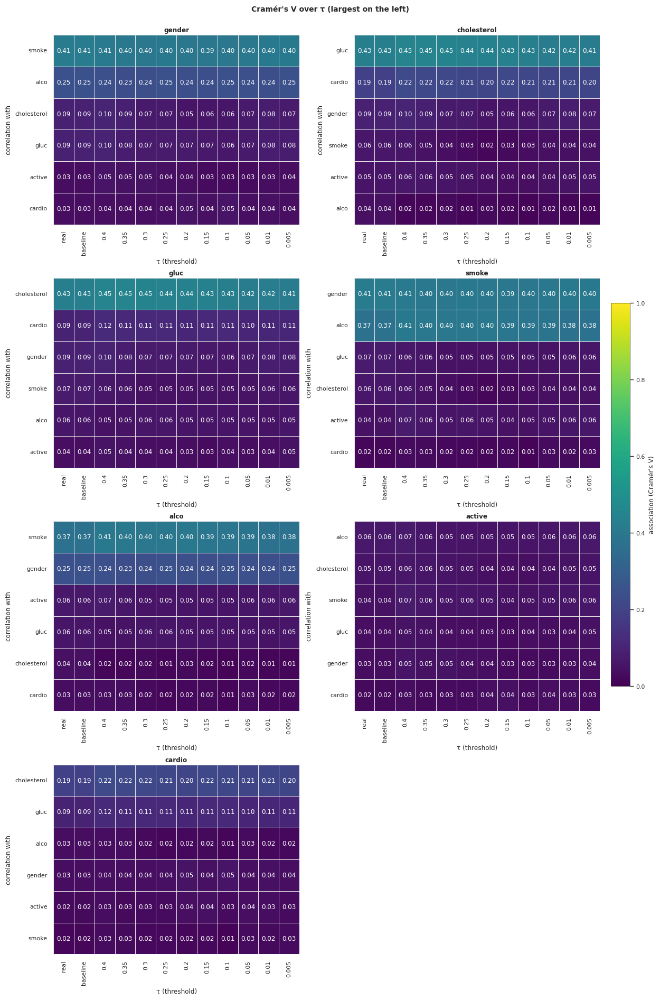

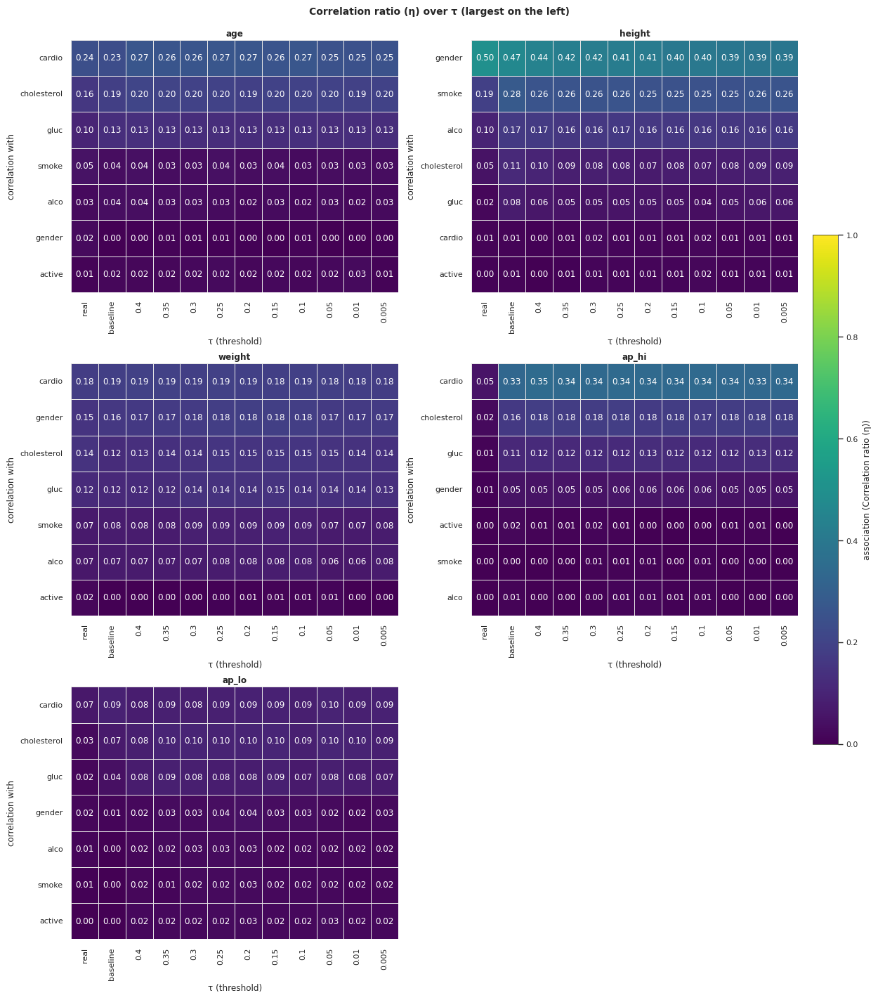

In [61]:
subset = filter_by_prefix(dict_results_cardio_ctgan_heom_any, 'cardio CTGAN')
plot_ressemblance_curves(subset, dataset='Cardio',
                         generator='CTGAN',
                         sample_size=49000)
real_pearson = dict_results_cardio_ctgan_heom_any['cardio CTGAN']['resemblance_evaluation_results']['numerical_multivariate']['pearson_real']
real_cramer = dict_results_cardio_ctgan_heom_any['cardio CTGAN']['resemblance_evaluation_results']["categorical_multivariate"]["cramer_synth"]

real_eta = dict_results_cardio_ctgan_heom_any['cardio CTGAN']['resemblance_evaluation_results']["categorical_numerical_multivariate"]['corr_ratio_real'][ "corr"]


plot_pearson_over_tau(dict_results_cardio_ctgan_heom_any, real_pearson)
plot_cramer_over_tau(dict_results_cardio_ctgan_heom_any, real_cramer)
plot_corr_ratio_over_tau(dict_results_cardio_ctgan_heom_any, real_eta)

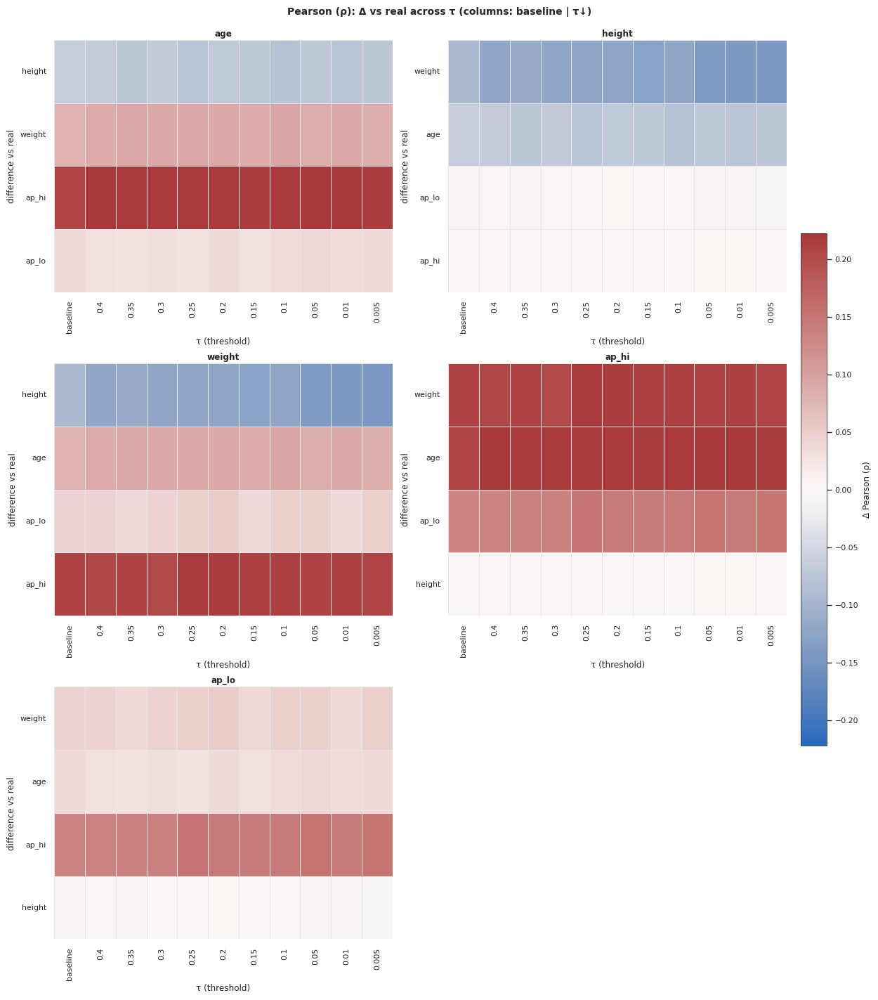

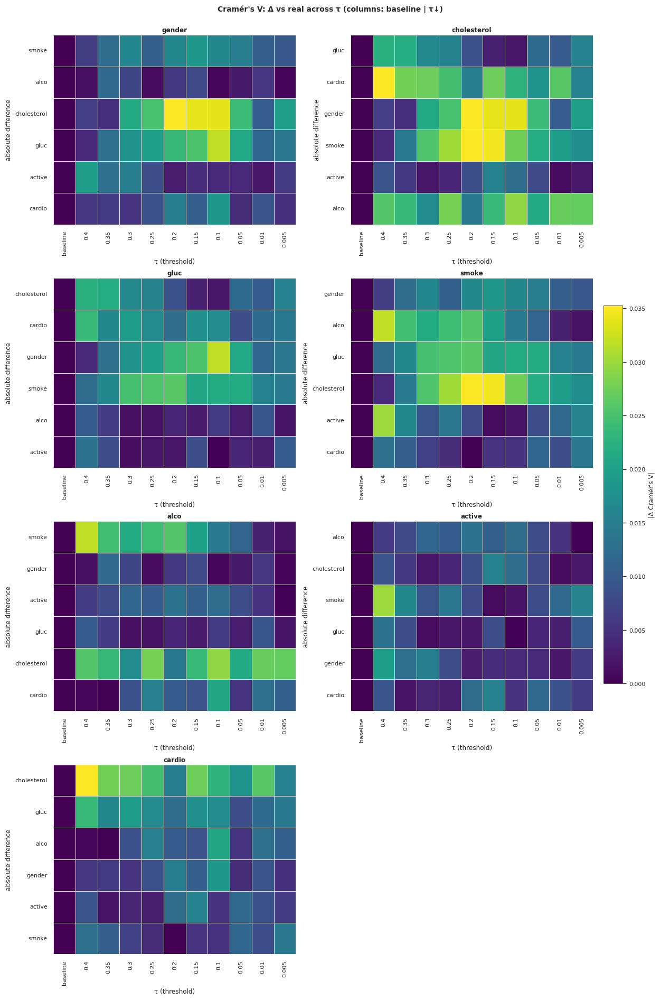

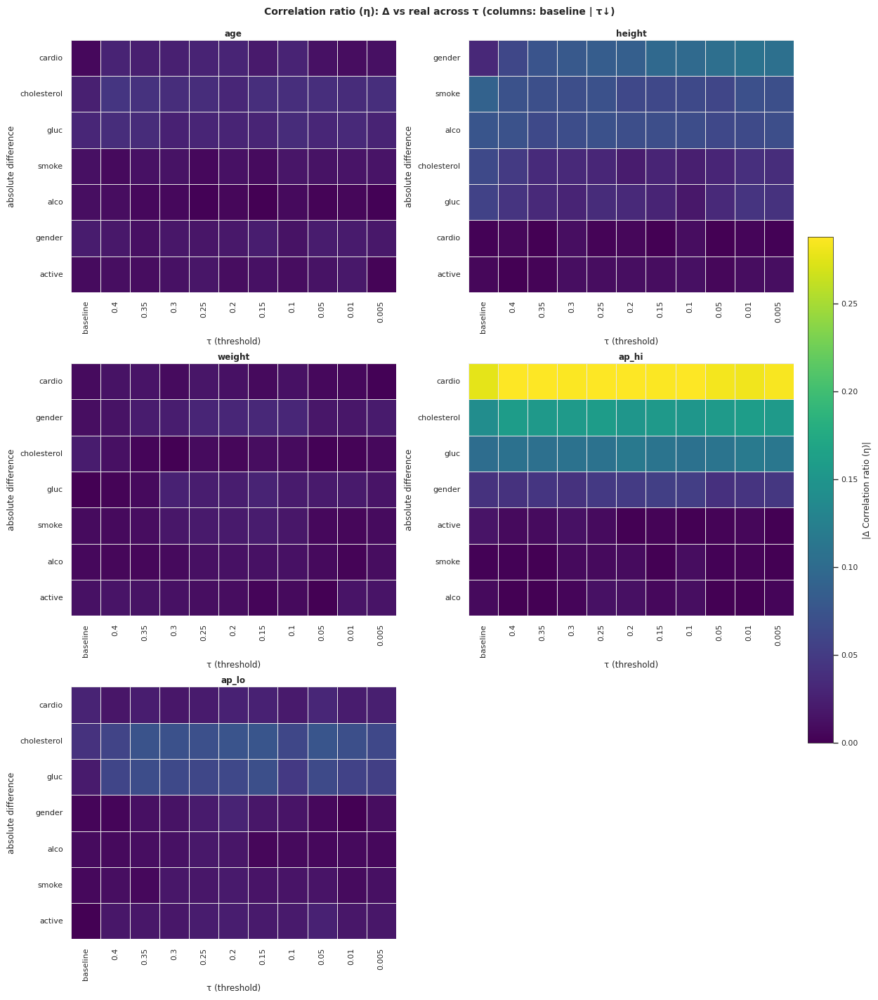

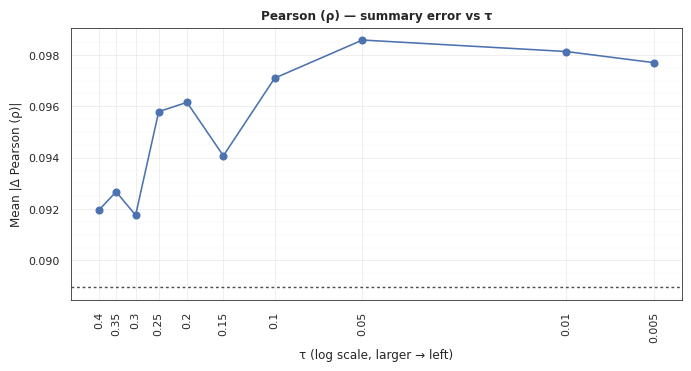

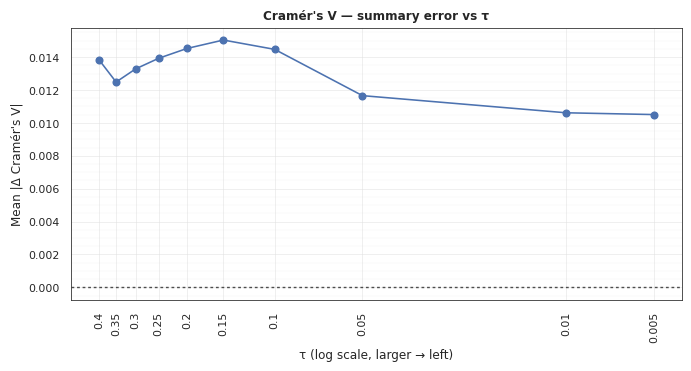

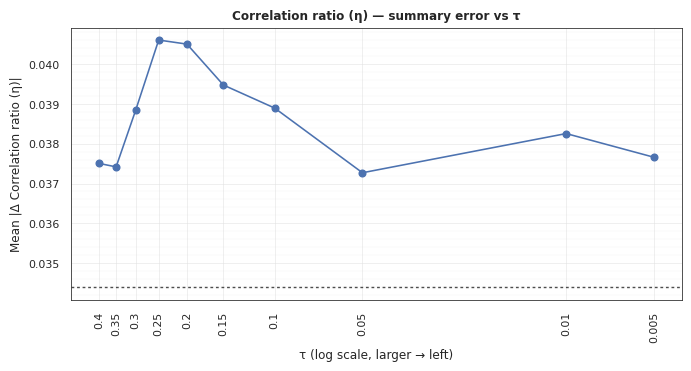

In [62]:
# Paths to your stored correlation matrices
pearson_path = ["resemblance_evaluation_results", "numerical_multivariate", "pearson_synth"]
cramer_path  = ["resemblance_evaluation_results", "categorical_multivariate", "cramer_synth"]
eta_path     = ["resemblance_evaluation_results", "categorical_numerical_multivariate", "corr_ratio_synth", "corr"]

real_pearson = dict_results_cardio_ctgan_heom_any['cardio CTGAN']['resemblance_evaluation_results']['numerical_multivariate']['pearson_real']
real_cramer = dict_results_cardio_ctgan_heom_any['cardio CTGAN']['resemblance_evaluation_results']["categorical_multivariate"]["cramer_synth"]

real_eta = dict_results_cardio_ctgan_heom_any['cardio CTGAN']['resemblance_evaluation_results']["categorical_numerical_multivariate"]['corr_ratio_real'][ "corr"]


# 1) Detailed Δ heatmaps (signed or absolute)
plot_delta_heatmaps_over_tau(dict_results_cardio_ctgan_heom_any, real_pearson, pearson_path, "Pearson (ρ)", absolute=False)
plot_delta_heatmaps_over_tau(dict_results_cardio_ctgan_heom_any, real_cramer,  cramer_path,  "Cramér's V", absolute=True)   # often nicer as |Δ|
plot_delta_heatmaps_over_tau(dict_results_cardio_ctgan_heom_any, real_eta,     eta_path,     "Correlation ratio (η)", absolute=True)

# 2) One-number summary over τ (pick mae / rmse / fro)
plot_matrix_error_over_tau(dict_results_cardio_ctgan_heom_any, real_pearson, pearson_path, "Pearson (ρ)", summary="mae")
plot_matrix_error_over_tau(dict_results_cardio_ctgan_heom_any, real_cramer,  cramer_path,  "Cramér's V", summary="mae")
plot_matrix_error_over_tau(dict_results_cardio_ctgan_heom_any, real_eta,     eta_path,     "Correlation ratio (η)", summary="mae")


In [58]:
epsilon = [ 'cardio TVAE : baseline',
            'cardio TVAE eps = 0.4',
            'cardio TVAE eps = 0.35',
            'cardio TVAE eps = 0.3',
            'cardio TVAE eps = 0.25',
            'cardio TVAE eps = 0.2',
            'cardio TVAE eps = 0.15',
            'cardio TVAE eps = 0.1',
            'cardio TVAE eps = 0.05',
            'cardio TVAE eps = 0.01',
            'cardio TVAE eps = 0.005']


print_correlation_matrices(dict_results_cardio_tvae_heom_any, epsilon, 'cardio TVAE')


 
 pearson correlation matrix - Real data cardio TVAE : 
 

|        |       age |     height |    weight |      ap_hi |      ap_lo |
|:-------|----------:|-----------:|----------:|-----------:|-----------:|
| age    | 1         | 0.080918   | 0.0542576 | 0.0229107  | 0.0195496  |
| height | 0.080918  | 1          | 0.291467  | 0.00716016 | 0.00951837 |
| weight | 0.0542576 | 0.291467   | 1         | 0.030205   | 0.0455419  |
| ap_hi  | 0.0229107 | 0.00716016 | 0.030205  | 1          | 0.015152   |
| ap_lo  | 0.0195496 | 0.00951837 | 0.0455419 | 0.015152   | 1          |

 
 cramer correlation matrix - Real data cardio TVAE : 
 

|             |     gender |   cholesterol |      gluc |     smoke |       alco |     active |     cardio |
|:------------|-----------:|--------------:|----------:|----------:|-----------:|-----------:|-----------:|
| gender      | 1          |     0.0401824 | 0.0200795 | 0.336965  | 0.168797   | 0.00427168 | 0.00712564 |
| cholesterol | 0.0401824  |     1   

#### Cardio-TVAE

In [16]:
epsilon = [ 'cardio TVAE : baseline',
            'cardio TVAE eps = 0.4',
            'cardio TVAE eps = 0.35',
            'cardio TVAE eps = 0.3',
            'cardio TVAE eps = 0.25',
            'cardio TVAE eps = 0.2',
            'cardio TVAE eps = 0.15',
            'cardio TVAE eps = 0.1',
            'cardio TVAE eps = 0.05',
            'cardio TVAE eps = 0.01',
            'cardio TVAE eps = 0.005']


print_correlation_matrices(dict_results_cardio_tvae_heom_any, epsilon, 'cardio TVAE')


 
 pearson correlation matrix - Real data cardio TVAE : 
 

|        |       age |     height |    weight |      ap_hi |      ap_lo |
|:-------|----------:|-----------:|----------:|-----------:|-----------:|
| age    | 1         | 0.080918   | 0.0542576 | 0.0229107  | 0.0195496  |
| height | 0.080918  | 1          | 0.291467  | 0.00716016 | 0.00951837 |
| weight | 0.0542576 | 0.291467   | 1         | 0.030205   | 0.0455419  |
| ap_hi  | 0.0229107 | 0.00716016 | 0.030205  | 1          | 0.015152   |
| ap_lo  | 0.0195496 | 0.00951837 | 0.0455419 | 0.015152   | 1          |

 
 cramer correlation matrix - Real data cardio TVAE : 
 

|             |     gender |   cholesterol |      gluc |     smoke |       alco |     active |     cardio |
|:------------|-----------:|--------------:|----------:|----------:|-----------:|-----------:|-----------:|
| gender      | 1          |     0.0401824 | 0.0200795 | 0.336965  | 0.168797   | 0.00427168 | 0.00712564 |
| cholesterol | 0.0401824  |     1   

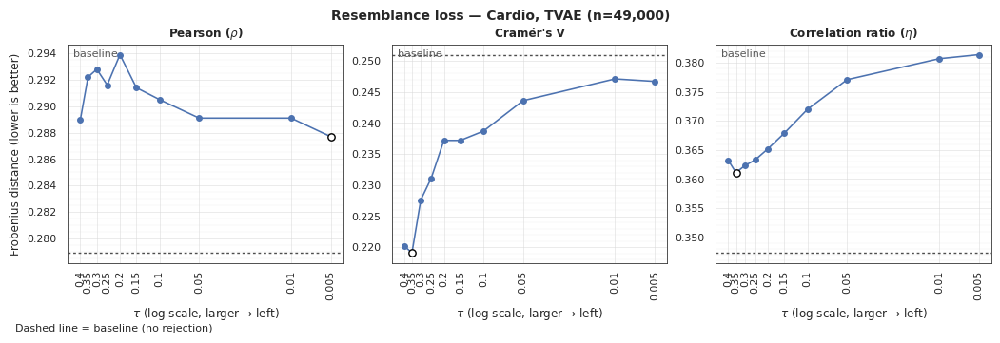

In [29]:
subset = filter_by_prefix(dict_results_cardio_tvae_heom_any, 'cardio TVAE')
plot_ressemblance_curves_notscale(subset, dataset='Cardio',
                         generator='TVAE',
                         sample_size=49000)

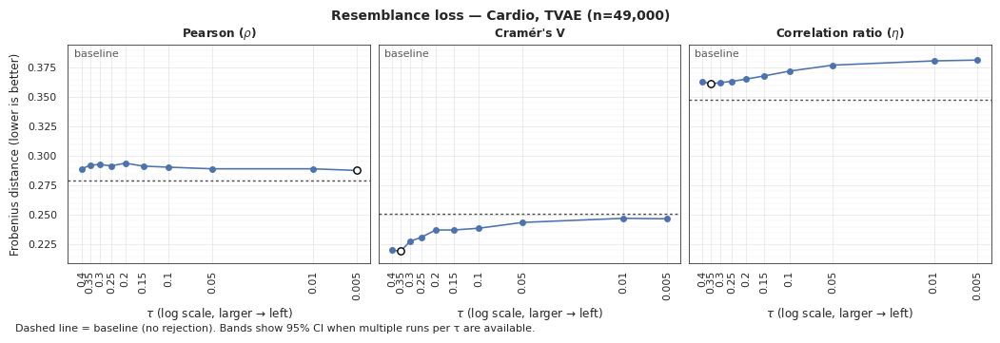

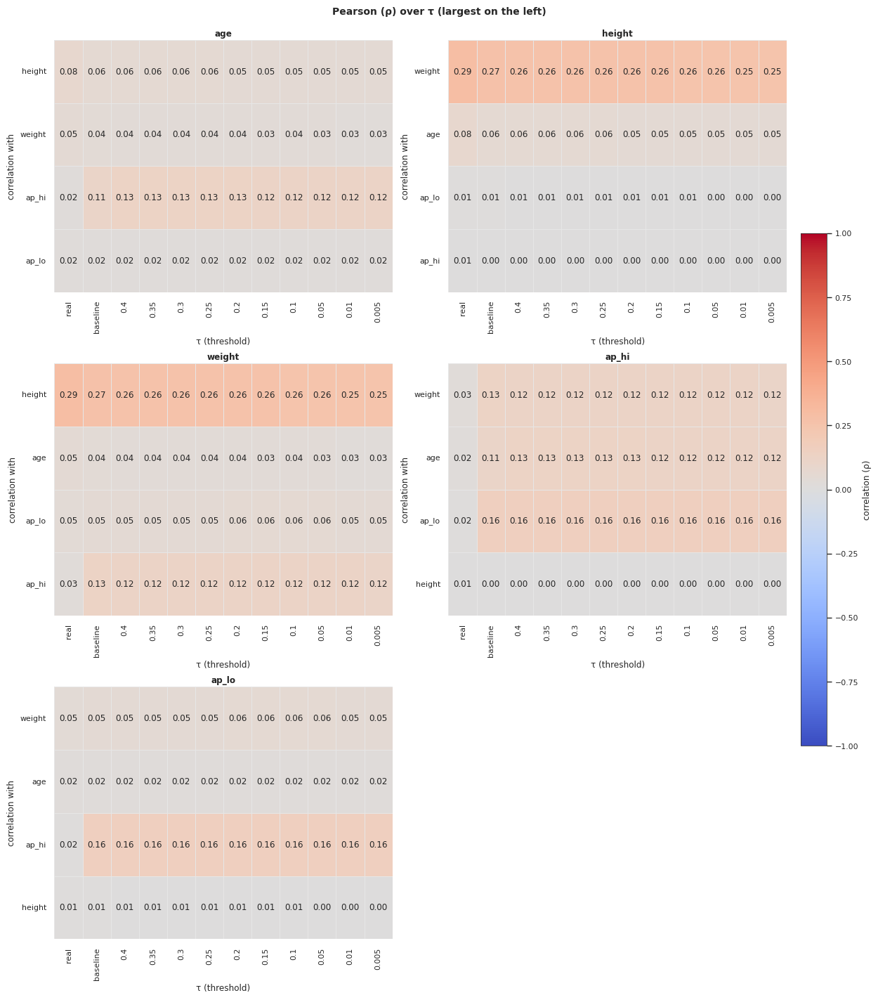

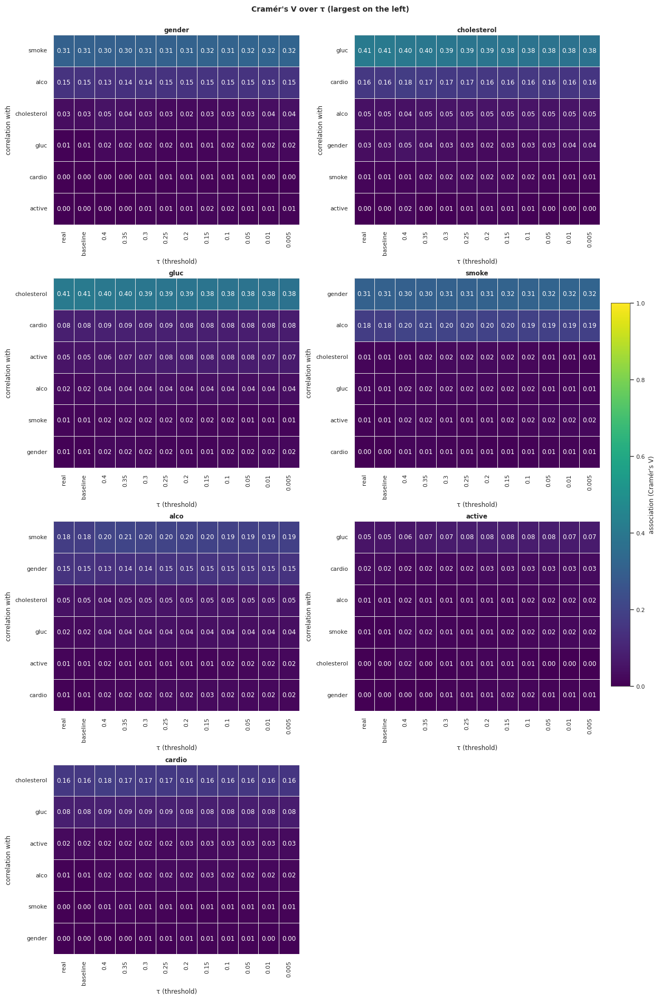

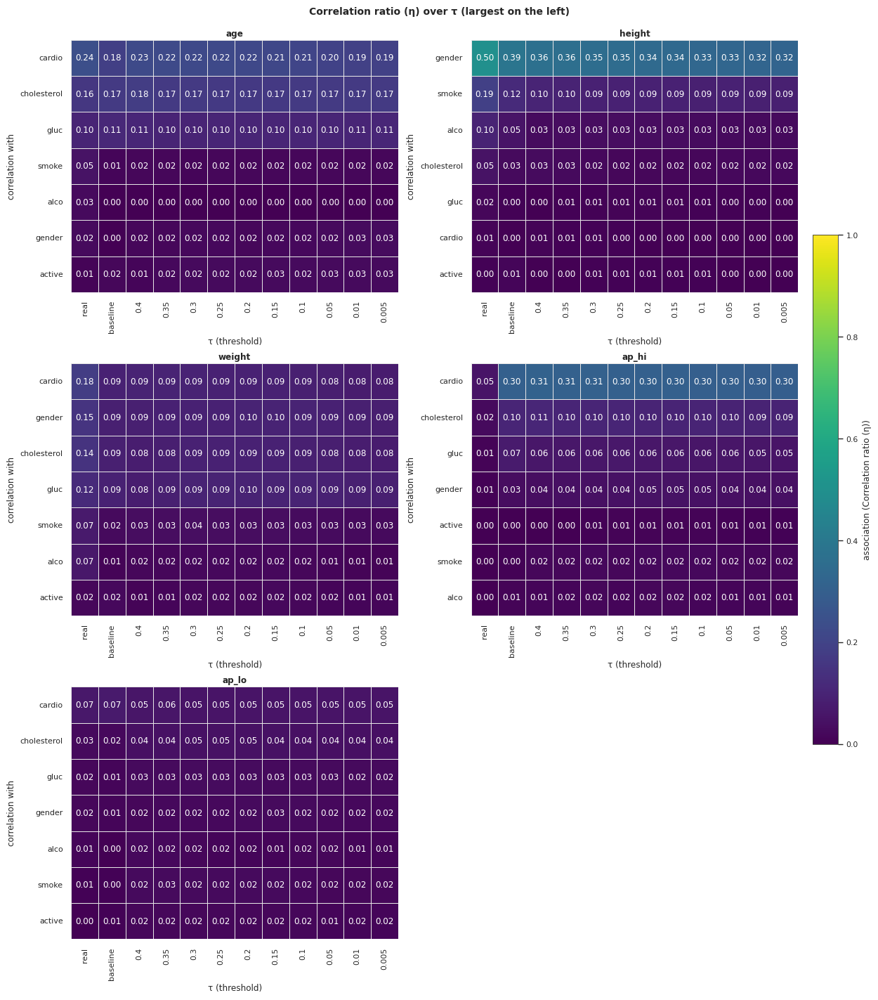

In [63]:
subset = filter_by_prefix(dict_results_cardio_tvae_heom_any, 'cardio TVAE')
plot_ressemblance_curves(subset, dataset='Cardio',
                         generator='TVAE',
                         sample_size=49000)
real_pearson = dict_results_cardio_tvae_heom_any['cardio TVAE']['resemblance_evaluation_results']['numerical_multivariate']['pearson_real']
real_cramer = dict_results_cardio_tvae_heom_any['cardio TVAE']['resemblance_evaluation_results']["categorical_multivariate"]["cramer_synth"]

real_eta = dict_results_cardio_tvae_heom_any['cardio TVAE']['resemblance_evaluation_results']["categorical_numerical_multivariate"]['corr_ratio_real'][ "corr"]


plot_pearson_over_tau(dict_results_cardio_tvae_heom_any, real_pearson)
plot_cramer_over_tau(dict_results_cardio_tvae_heom_any, real_cramer)
plot_corr_ratio_over_tau(dict_results_cardio_tvae_heom_any, real_eta)

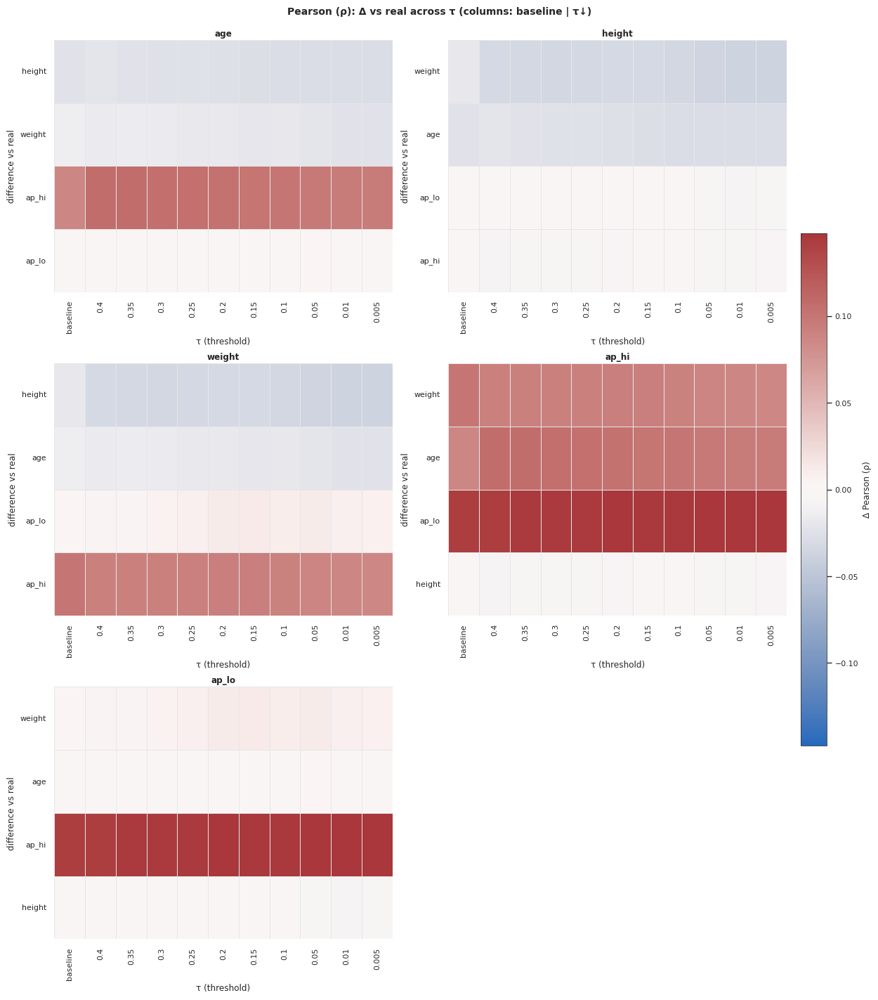

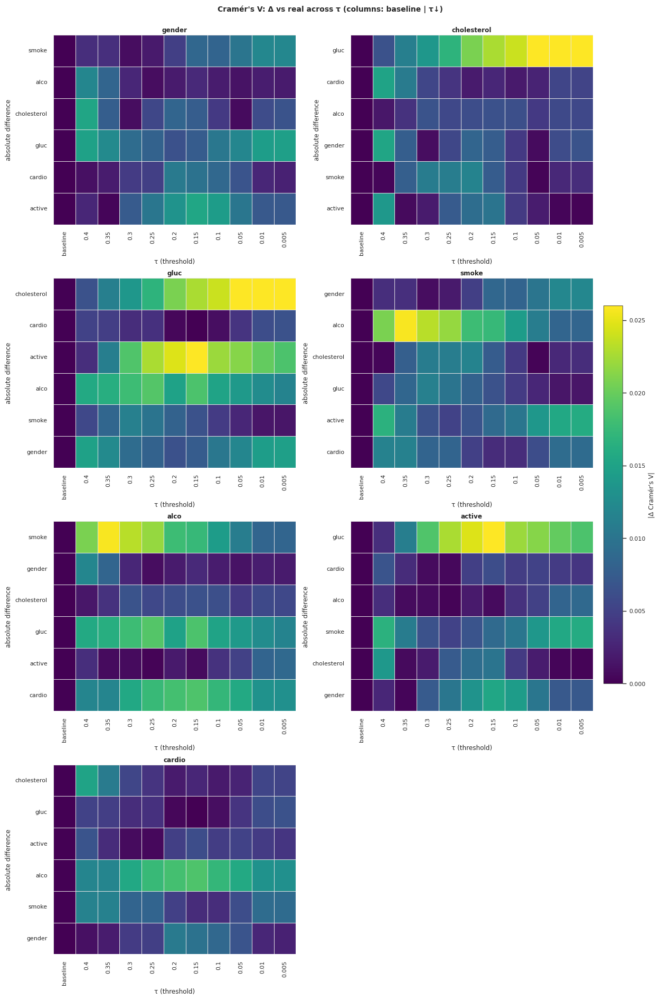

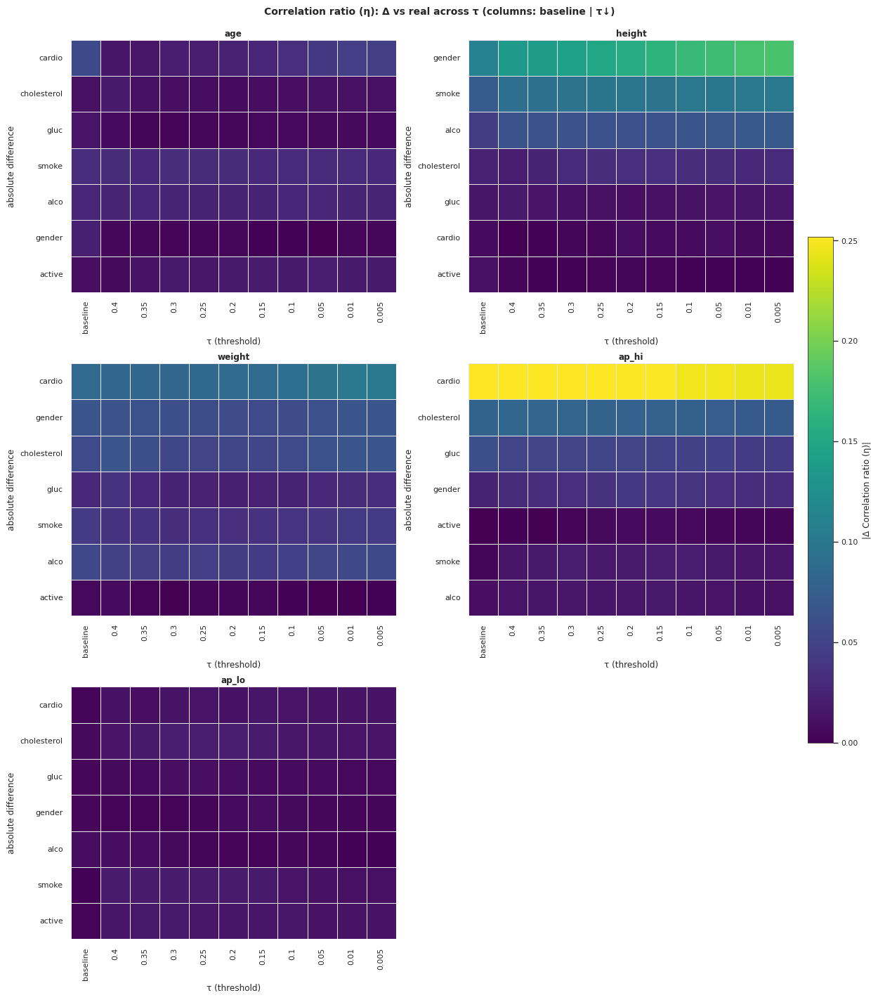

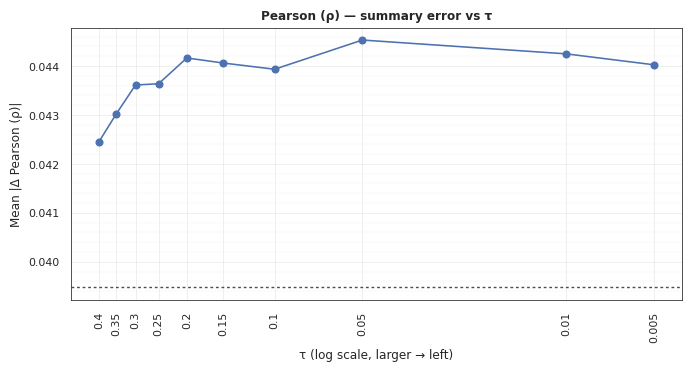

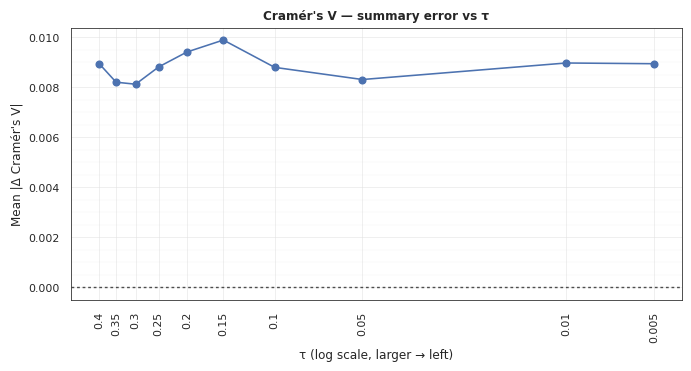

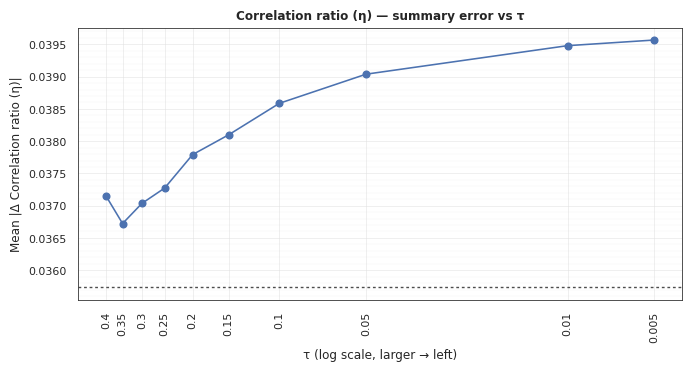

In [64]:
# Paths to your stored correlation matrices
pearson_path = ["resemblance_evaluation_results", "numerical_multivariate", "pearson_synth"]
cramer_path  = ["resemblance_evaluation_results", "categorical_multivariate", "cramer_synth"]
eta_path     = ["resemblance_evaluation_results", "categorical_numerical_multivariate", "corr_ratio_synth", "corr"]

real_pearson = dict_results_cardio_tvae_heom_any['cardio TVAE']['resemblance_evaluation_results']['numerical_multivariate']['pearson_real']
real_cramer = dict_results_cardio_tvae_heom_any['cardio TVAE']['resemblance_evaluation_results']["categorical_multivariate"]["cramer_synth"]

real_eta = dict_results_cardio_tvae_heom_any['cardio TVAE']['resemblance_evaluation_results']["categorical_numerical_multivariate"]['corr_ratio_real'][ "corr"]


# 1) Detailed Δ heatmaps (signed or absolute)
plot_delta_heatmaps_over_tau(dict_results_cardio_tvae_heom_any, real_pearson, pearson_path, "Pearson (ρ)", absolute=False)
plot_delta_heatmaps_over_tau(dict_results_cardio_tvae_heom_any, real_cramer,  cramer_path,  "Cramér's V", absolute=True)   # often nicer as |Δ|
plot_delta_heatmaps_over_tau(dict_results_cardio_tvae_heom_any, real_eta,     eta_path,     "Correlation ratio (η)", absolute=True)

# 2) One-number summary over τ (pick mae / rmse / fro)
plot_matrix_error_over_tau(dict_results_cardio_tvae_heom_any, real_pearson, pearson_path, "Pearson (ρ)", summary="mae")
plot_matrix_error_over_tau(dict_results_cardio_tvae_heom_any, real_cramer,  cramer_path,  "Cramér's V", summary="mae")
plot_matrix_error_over_tau(dict_results_cardio_tvae_heom_any, real_eta,     eta_path,     "Correlation ratio (η)", summary="mae")
